# Topo SparseDream with Hebbian Lateral Excitation

## Intro

* **Date**: 12/15/2020
* **What**: The title says it all.  Basically the same architecture as the last experiment, but this time I'm using a Hebbian learning rule for the lateral excitatory connections.
* **Why**: When I was using a reconstruction rule for lateral excitatory connections, neurons would dominate the inputs of other neurons, causing them to straight-up not learn a feature.  That's about the worst thing ever, isn't it?  So basically, it seems to make sense that the neurons wouldn't dominate each other if the lateral excitation is Hebbian.  That's the idea, at least.
* **Hopes**: The hope is always that I learn a beautiful, nice-looking topological map of features with vertical manifolds.
* **Limitations**: Because the neurons don't *have* to make excitatory connections, there's no reason they will.  Thus, there might not be any "topological sewing" of the feature space that I so desire.  We'll see. Maybe if I initialize all the lateral excitatory synapses to have a positive value initially.

## Code

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.datasets import mnist
from tqdm import tqdm
from scipy.special import expit as sig

(train_x, train_y), (test_x, test_y) = mnist.load_data()

m_flat_tr = train_x.reshape(train_x.shape[0], -1) / 255.0
m_flat_te = test_x.reshape(test_x.shape[0], -1) / 255.0 

m_tr_len, m_len = m_flat_tr.shape

def draw_weights(w, Kx, Ky, s_len, fig):
    tapestry = np.zeros((s_len * Ky, s_len * Kx))
    
    w_i = 0
    for y in range(Ky):
        for x in range(Kx):
            tapestry[y * s_len: (y + 1) * s_len, x * s_len: (x + 1) * s_len] = w[w_i].reshape(s_len, s_len)
            w_i += 1
            
    plt.clf()        
    max_val = np.max(tapestry)
    im = plt.imshow(tapestry, cmap="Greys", vmax=max_val)
    fig.colorbar(im, ticks=[0, max_val])
    plt.axis("off")
    fig.canvas.draw()

<IPython.core.display.Javascript object>


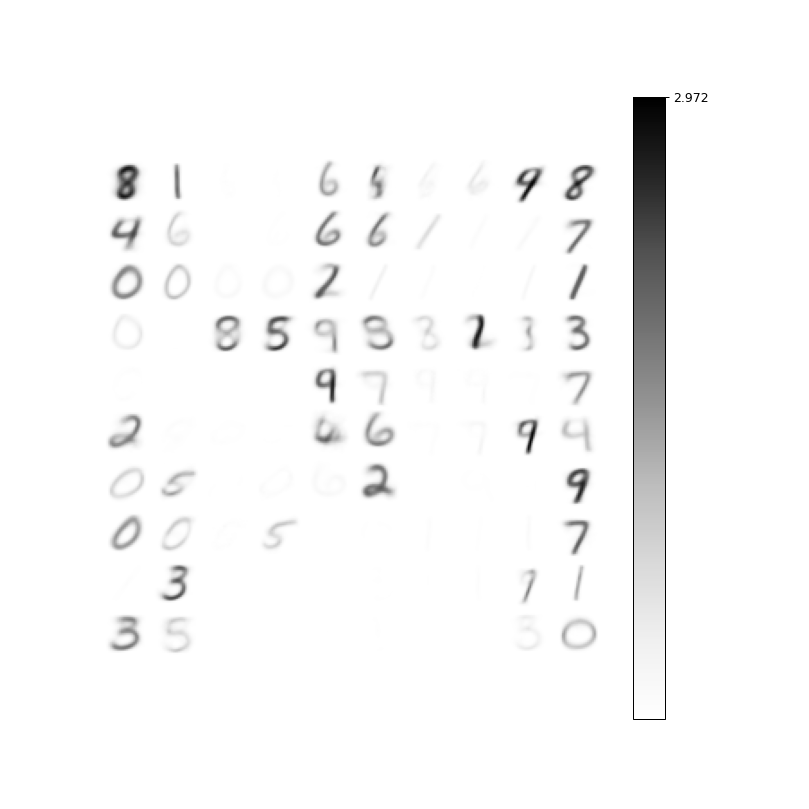

100%|███████████████████████████████████████████████████████████| 6000/6000 [00:03<00:00, 1512.45it/s]


In [2]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 6000

Kx = 10
Ky = 10
N = Kx * Ky
m_len = 28 * 28
tr_len = 60000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.02

# Initialize topological excitation
y_ex = 1    # Vertical neighbor max distance
x_ex = 3    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
lat_ex = np.zeros((N, N))
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.01

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.001 / Ky

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 3
sp = 0.01
sp2 = sp * sp

for ep in range(Nep):
    inputs = m_flat_tr[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
#         o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ w_v) - t)
        o = sig(w_v +((lat_ex - g_lat_in) @ w_v) - t)
        
        # Train
        
        # Inhibition
        o_o = (o * o.T) - sp2
        
        # Global inhibition
        g_lat_in += o_o * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += o_o * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
#         o_r = lat_ex.T @ ff
#         mod_o_r = np.maximum(o_r, prec)
#         o_e = ff - o_r
        
#         lat_ex += lat_ex * ff * (o_e / mod_o_r).T * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_weights(w, Kx, Ky, 28, fig)

Son of a motherless goat.  We're getting domination again.  

## Analysis Dialog

I have to figure out how and why this is happening.

<IPython.core.display.Javascript object>


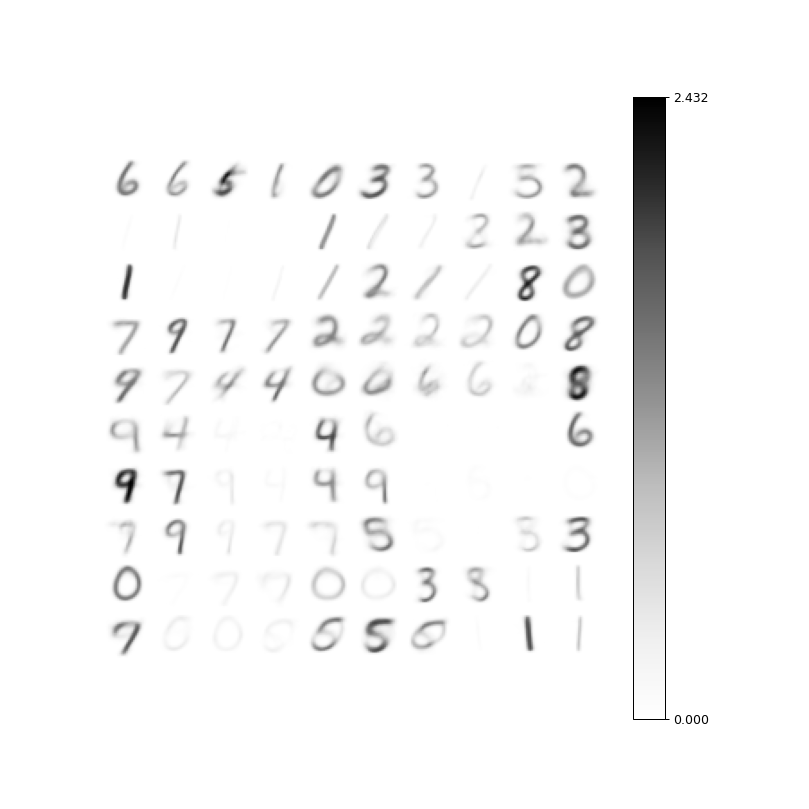

100%|███████████████████████████████████████████████████████████| 6000/6000 [00:04<00:00, 1453.65it/s]


In [24]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 6000

Kx = 10
Ky = 10
N = Kx * Ky
m_len = 28 * 28
tr_len = 60000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.02

# Initialize topological excitation
y_ex = 1    # Vertical neighbor max distance
x_ex = 3    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
lat_ex = np.array(lat_ex_mask)
lat_ex /= np.linalg.norm(lat_ex, axis=1)
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.001

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
np.fill_diagonal(m_lat_in_mask, 0)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.001 / Ky

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 3
sp = 0.01
sp2 = sp * sp

for ep in range(Nep):
    inputs = m_flat_tr[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ w_v) - t)
#         o = sig(w_v +((lat_ex - g_lat_in) @ w_v) - t)
        
        # Train
        
        # Inhibition
        o_o = (o * o.T) - sp2
        
        # Global inhibition
        g_lat_in += o_o * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += o_o * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
#         o_r = lat_ex.T @ ff
#         mod_o_r = np.maximum(o_r, prec)
#         o_e = ff - o_r
        
#         lat_ex += lat_ex * ff * (o_e / mod_o_r).T * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_weights(w, Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


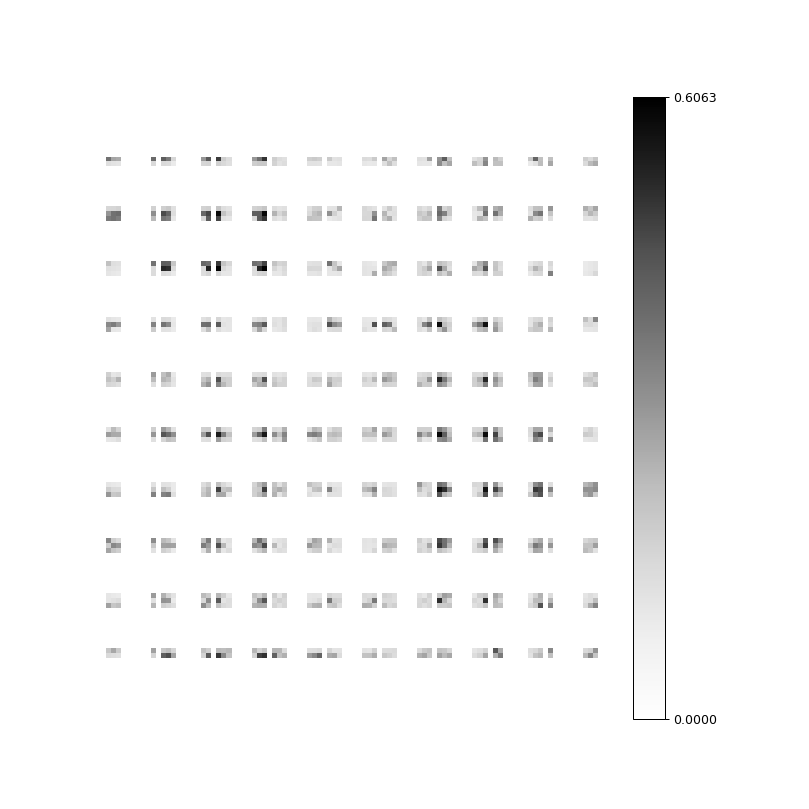

In [27]:
fig = plt.figure(figsize=(10, 10))

draw_weights(lat_ex, 10, 10, 10, fig)

<IPython.core.display.Javascript object>


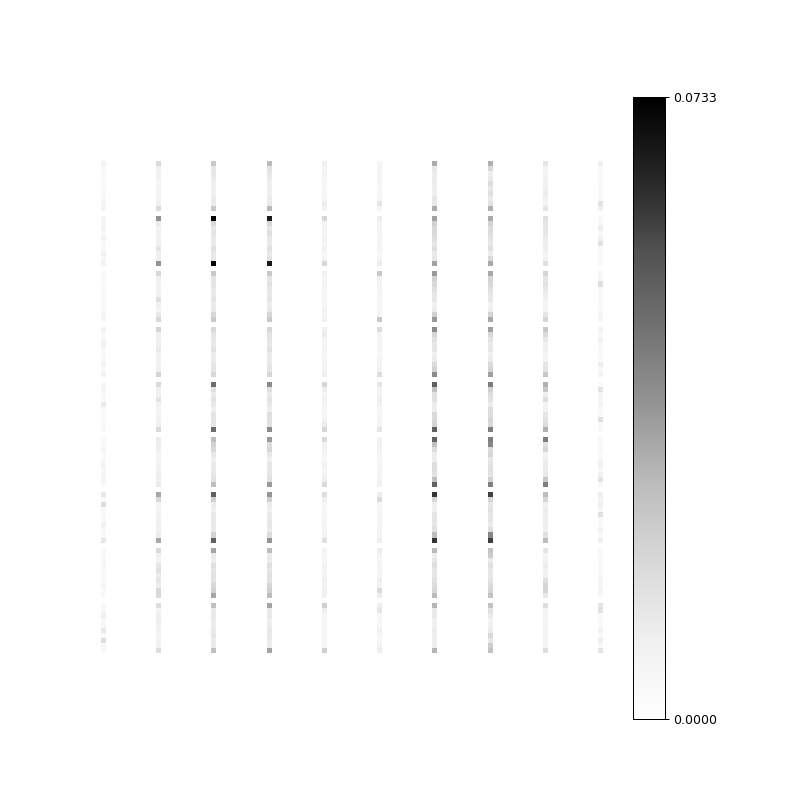

In [44]:
fig = plt.figure(figsize=(10, 10))

draw_weights(m_lat_in, 10, 10, 10, fig)

<IPython.core.display.Javascript object>


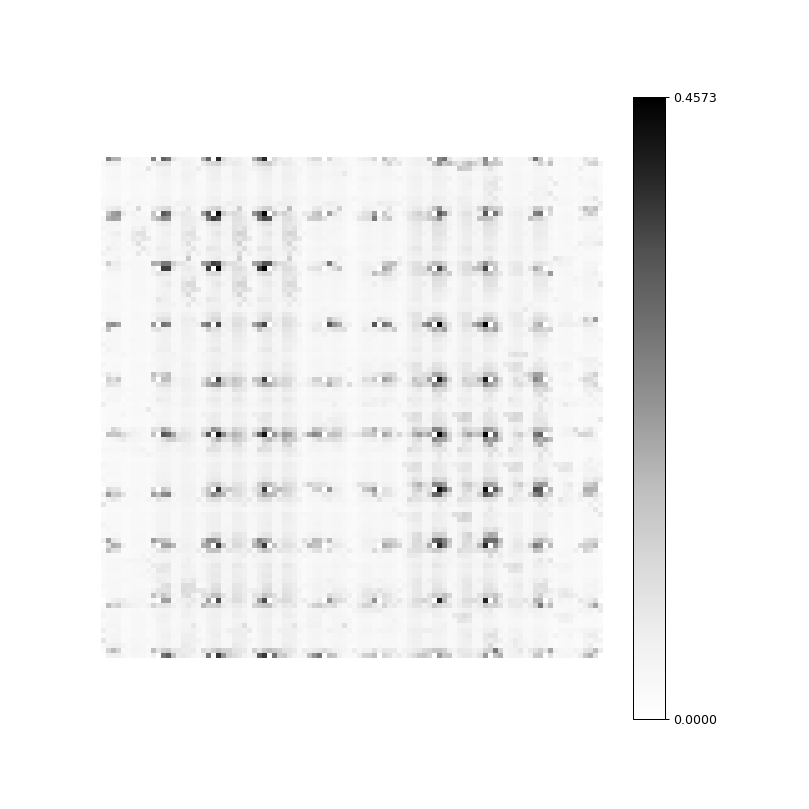

In [37]:
fig = plt.figure(figsize=(10, 10))

draw_weights(g_lat_in, 10, 10, 10, fig)

Oh, I'm such a goose.  I figured out that I can mitigate the effect of domination by slowing how fast the lat ex synapses learn, but why do think there's domination in the first place?  Probably because I'm training lat_ex synapses on the total output, and not the feedforward output?  Yeah, that'll do it every time. 

Oh, and I also wasn't zeroing the diagonals of the column inhibition, so god only knows what that was doing.

So yeah, time to train excitation on feedforward.

<IPython.core.display.Javascript object>


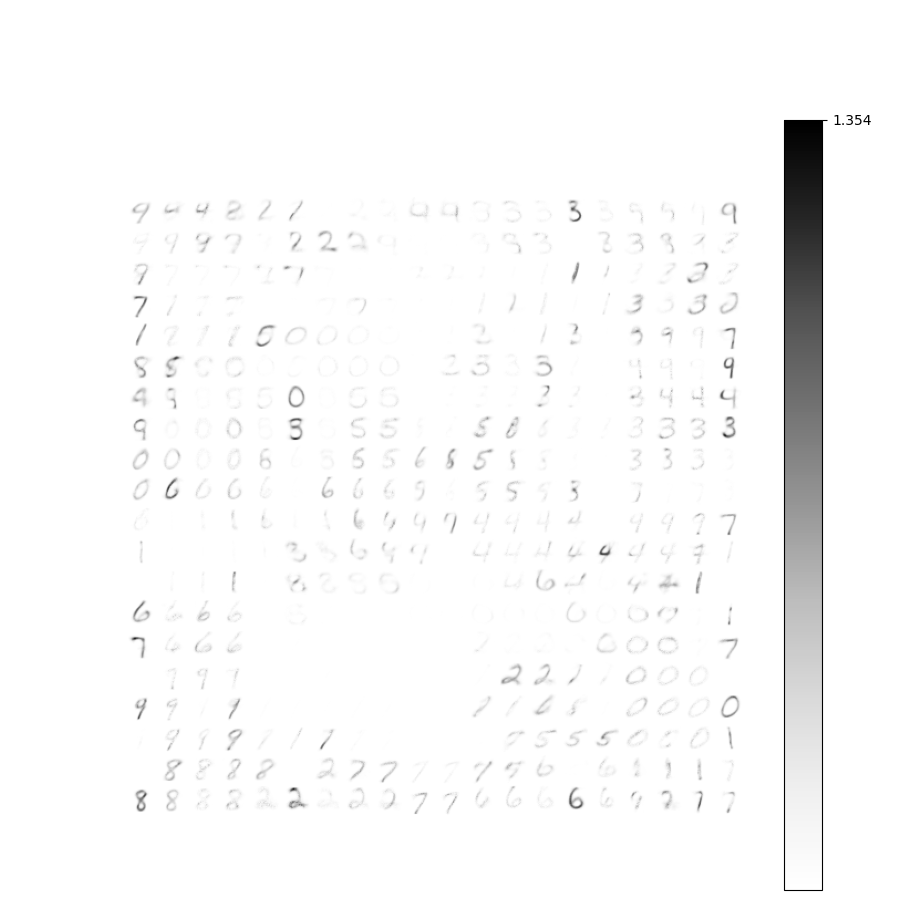

 10%|██████▍                                                       | 618/6000 [00:07<01:04, 84.06it/s]


KeyboardInterrupt: 

In [53]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 6000

Kx = 20
Ky = 20
N = Kx * Ky
m_len = 28 * 28
tr_len = 60000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.02

# Initialize topological excitation
y_ex = 1    # Vertical neighbor max distance
x_ex = 3    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
lat_ex = np.array(lat_ex_mask)
lat_ex /= np.linalg.norm(lat_ex, axis=1)
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.001

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
np.fill_diagonal(m_lat_in_mask, 0)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.001 / Ky

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 3
sp = 0.0125
sp2 = sp * sp

for ep in range(Nep):
    inputs = m_flat_tr[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ w_v) - t)
        
        # Train
        
        # Inhibition
        o_o = (o * o.T) - sp2
        
        # Global inhibition
        g_lat_in += o_o * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += o_o * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * ff * (ff.T - lat_ex) * alpha
#         o_r = lat_ex.T @ ff
#         mod_o_r = np.maximum(o_r, prec)
#         o_e = ff - o_r
        
#         lat_ex += lat_ex * ff * (o_e / mod_o_r).T * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_weights(w, Kx, Ky, 28, fig)

Fascinating as that is, it's no good.  

<IPython.core.display.Javascript object>


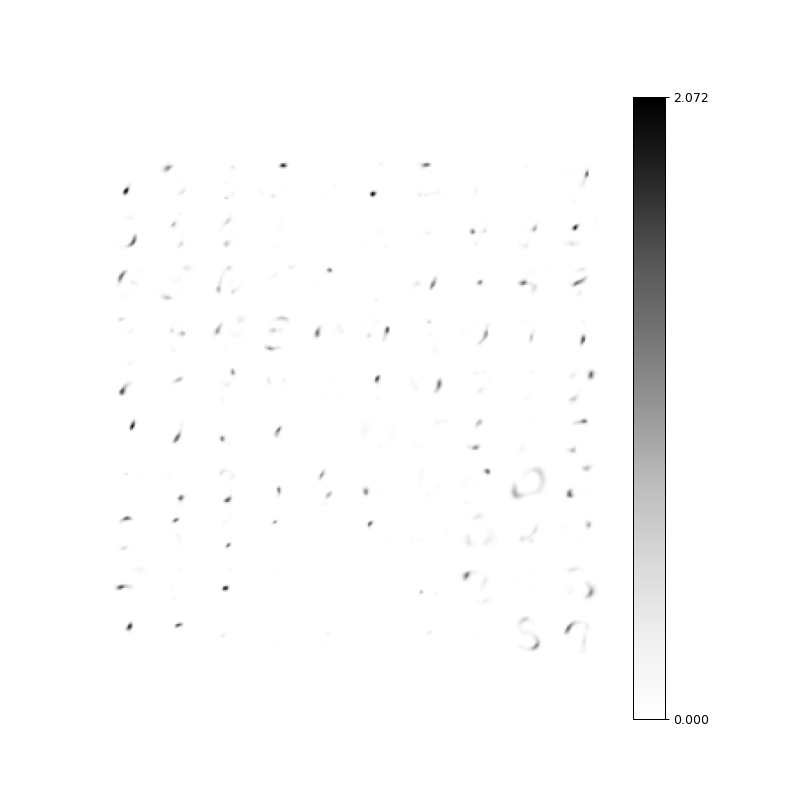

100%|███████████████████████████████████████████████████████████| 6000/6000 [00:04<00:00, 1452.64it/s]


In [61]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 6000

Kx = 10
Ky = 10
N = Kx * Ky
m_len = 28 * 28
tr_len = 60000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.005

# Initialize topological excitation
y_ex = 1    # Vertical neighbor max distance
x_ex = 2    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
# lat_ex = np.array(lat_ex_mask)
# lat_ex /= np.linalg.norm(lat_ex, axis=1)
lat_ex = np.zeros((N, N))
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.0001

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
np.fill_diagonal(m_lat_in_mask, 0)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.001 / Ky

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 3
sp = 0.08
sp2 = sp * sp

for ep in range(Nep):
    inputs = m_flat_tr[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ w_v) - t)
        
        # Train
        
        # Inhibition
        o_o = (o * o.T) - sp2
        
        # Global inhibition
        g_lat_in += o_o * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += o_o * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * ff * (ff.T - lat_ex) * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_weights(w, Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


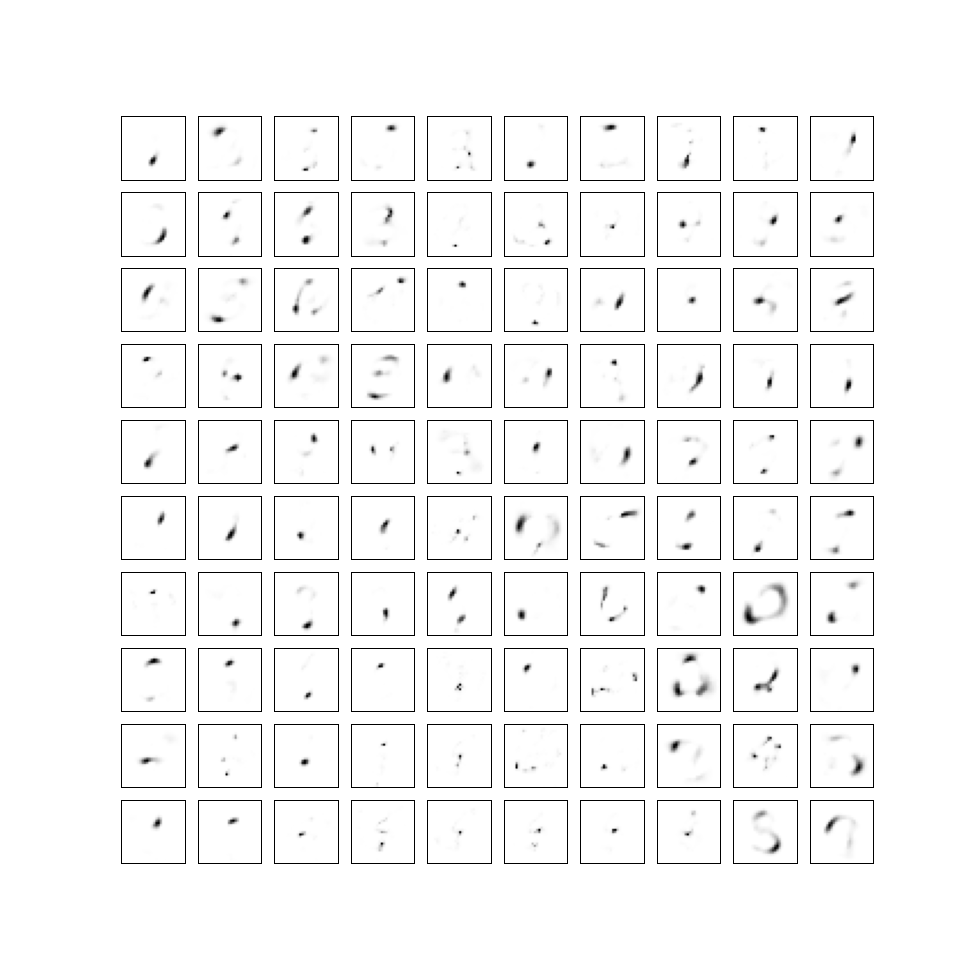

In [62]:
fig = plt.figure(figsize=(12, 12))

for x in range(Kx):
    for y in range(Ky):
        plt.subplot(Ky, Kx, 1 + x + (Kx * y))
        plt.xticks([])
        plt.yticks([])
        plt.imshow(w[x + (Kx * y)].reshape(28, 28), cmap="Greys")
plt.show()

Well, this super isn't great.  There isn't a topological connection in sight.  I'll maybe just do some reconstructions?  See how they look?

<IPython.core.display.Javascript object>


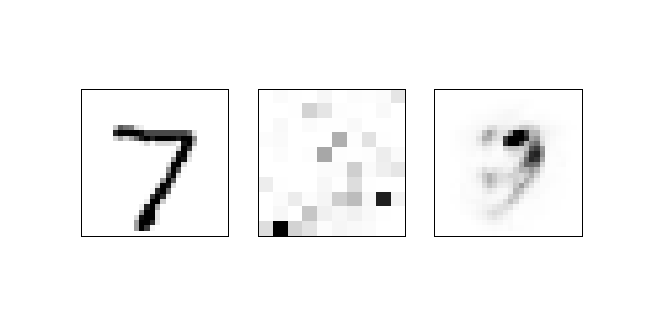

In [63]:
img_i = 0

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ w_v) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


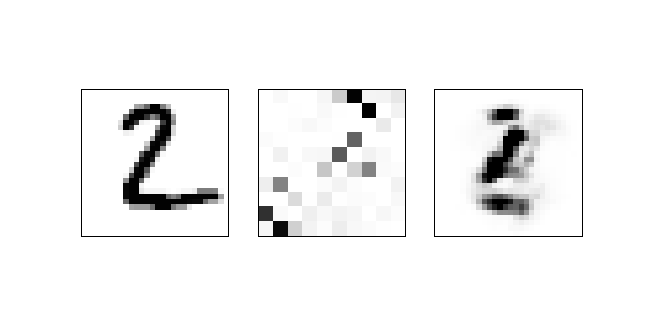

In [64]:
img_i = 1

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ w_v) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


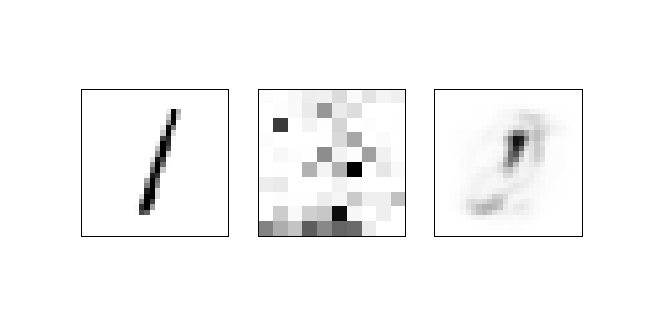

In [65]:
img_i = 2

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ w_v) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


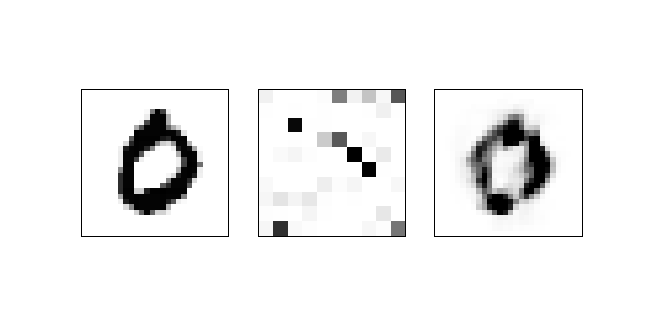

In [66]:
img_i = 3

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ w_v) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


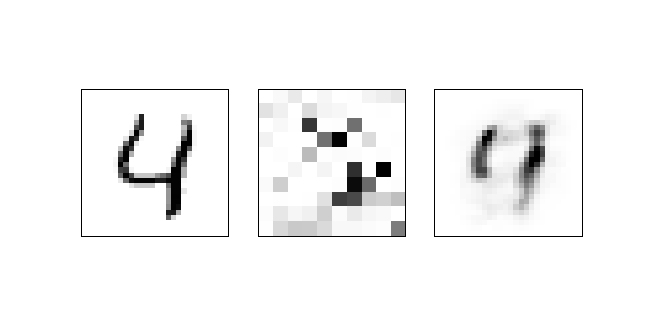

In [67]:
img_i = 4

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ w_v) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


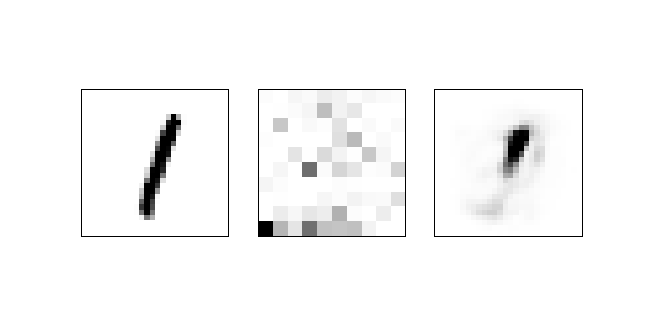

In [72]:
img_i = 5

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ w_v) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

Yikes.  Those are absolutely atrocious.  

I'm going to try two things.  First I'm going to try applying the lateral connections on `ff`.  Cause it's smaller.

Then, I'm going to try fixed weights for lat_ex.

<IPython.core.display.Javascript object>


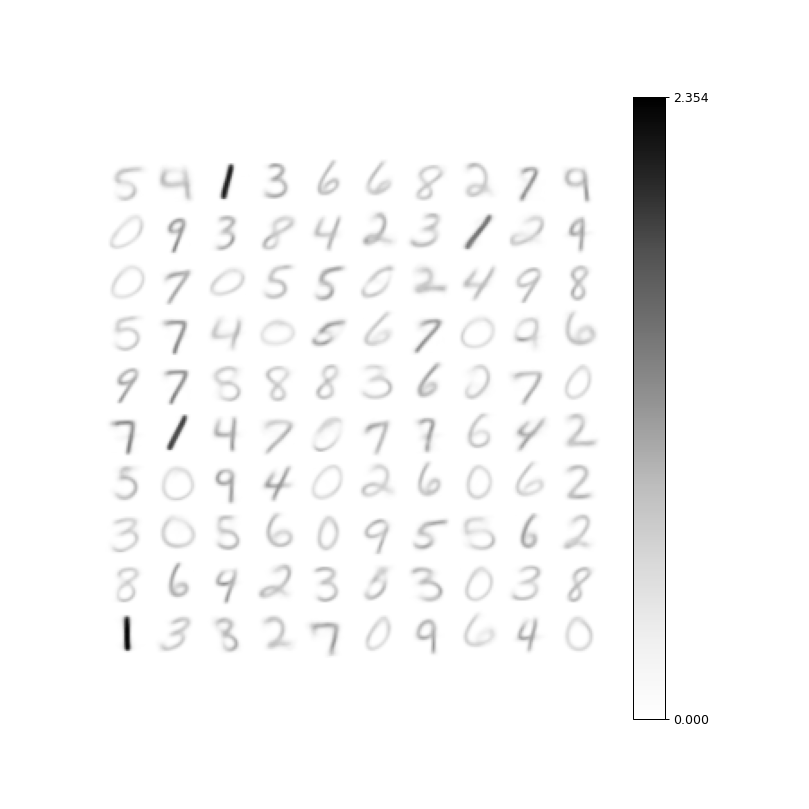

100%|███████████████████████████████████████████████████████████| 6000/6000 [00:04<00:00, 1381.31it/s]


In [76]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 6000

Kx = 10
Ky = 10
N = Kx * Ky
m_len = 28 * 28
tr_len = 60000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.02

# Initialize topological excitation
y_ex = 1    # Vertical neighbor max distance
x_ex = 2    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
# lat_ex = np.array(lat_ex_mask)
# lat_ex /= np.linalg.norm(lat_ex, axis=1)
lat_ex = np.zeros((N, N))
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.0001

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
np.fill_diagonal(m_lat_in_mask, 0)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.001 / Ky

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 3
sp = 0.01
sp2 = sp * sp

for ep in range(Nep):
    inputs = m_flat_tr[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
        
        # Train
        
        # Inhibition
        o_o = (o * o.T) - sp2
        
        # Global inhibition
        g_lat_in += o_o * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += o_o * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_weights(w, Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


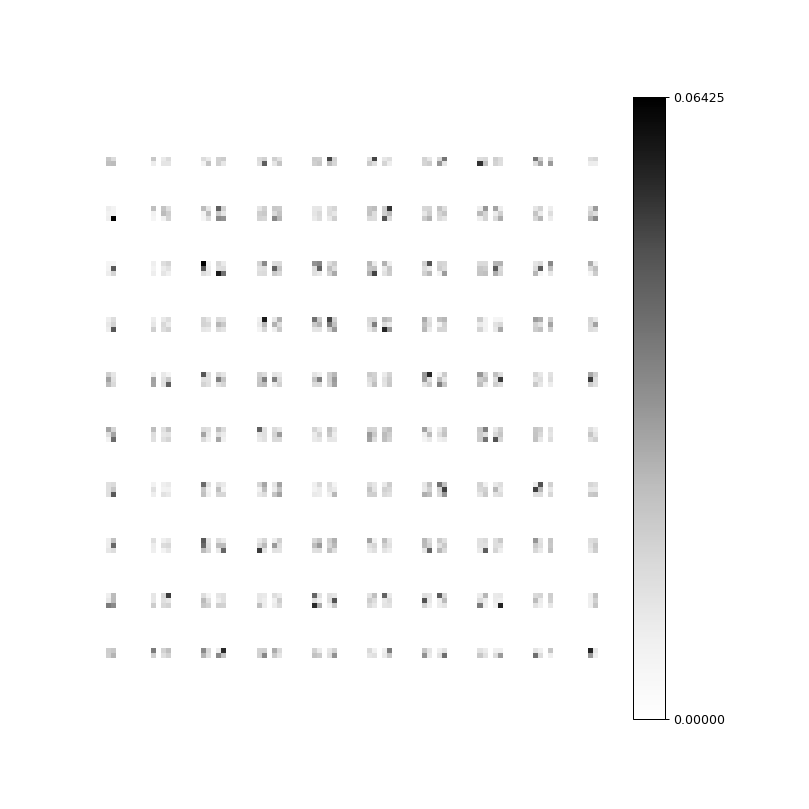

In [77]:
fig = plt.figure(figsize=(10, 10))

draw_weights(lat_ex, 10, 10, 10, fig)

<IPython.core.display.Javascript object>


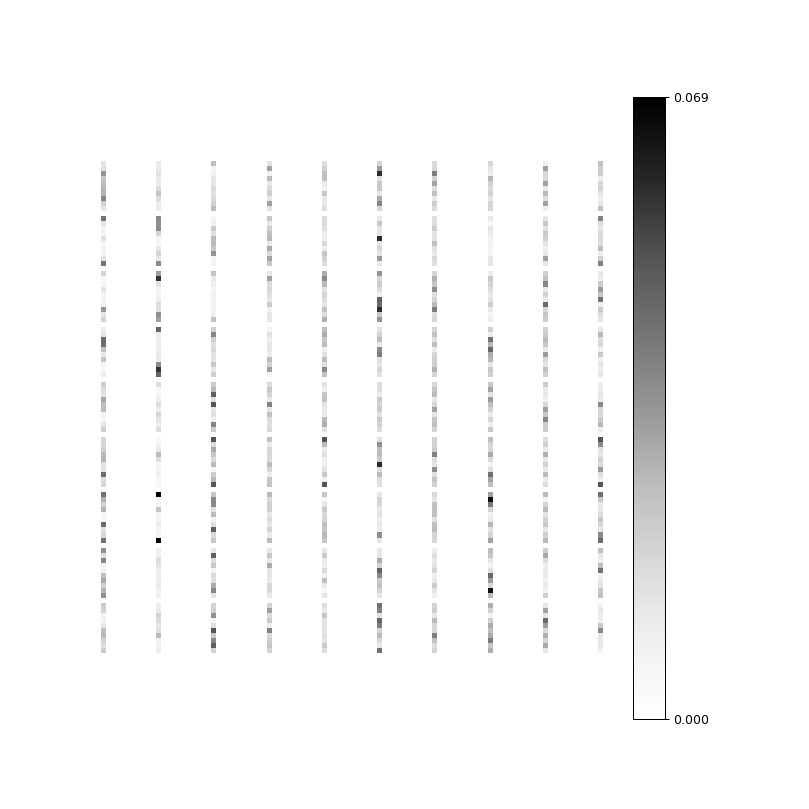

In [78]:
fig = plt.figure(figsize=(10, 10))

draw_weights(m_lat_in, 10, 10, 10, fig)

<IPython.core.display.Javascript object>


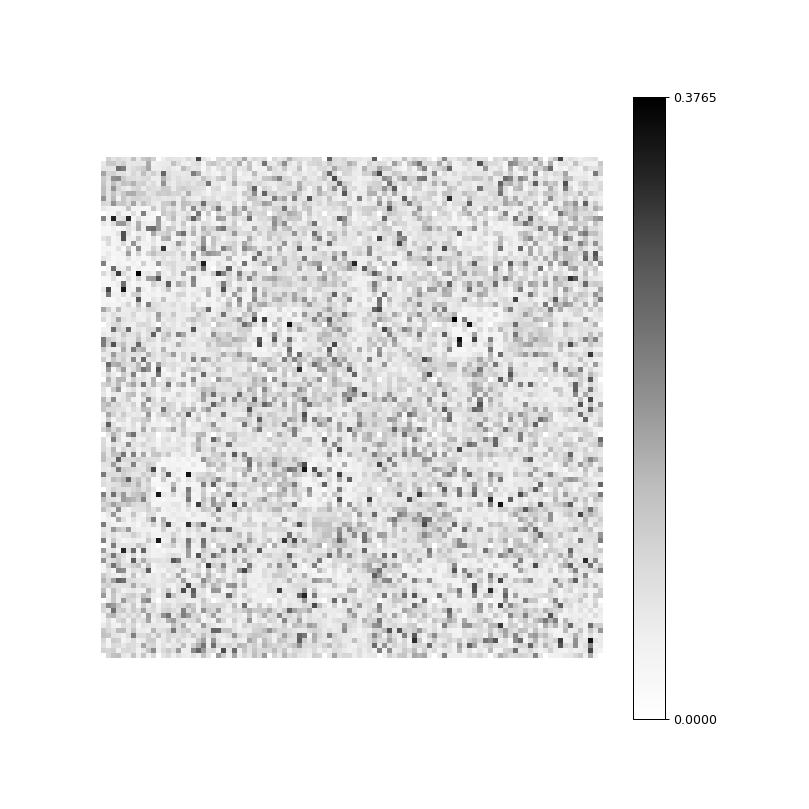

In [79]:
fig = plt.figure(figsize=(10, 10))

draw_weights(g_lat_in, 10, 10, 10, fig)

Ok! Awesome!  That seems to fix everything right up!  Almost, at least. I think the reason why this did sooooo much better is because now the lateral synapses are taking into account the sparsity adjusted output, wherein lies the non-linearity.  And that makes total sense, because that's what should be driving the lateral connections.  The threshold-adjusted output, that is.

One compelling thing that I'm seeing is the fact that there are vertical "lines" of digits.  So I see a stack of 7s, there are some vertical pairs of zeros.  That's good because hopefully the network is grouping together features that are anchored to the same local structure.  

Ok, I'm going to mess with the size of the lateral excitation.

<IPython.core.display.Javascript object>


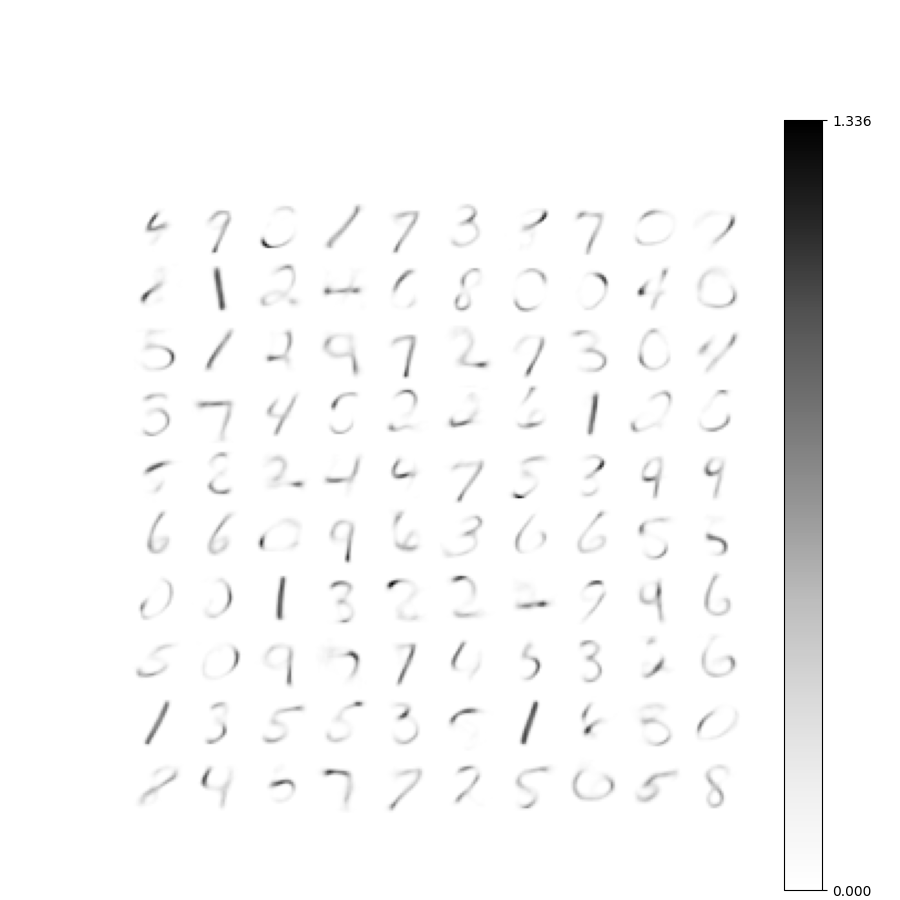

 33%|███████████████████▍                                       | 1974/6000 [00:01<00:02, 1383.24it/s]


KeyboardInterrupt: 

In [85]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 6000

Kx = 10
Ky = 10
N = Kx * Ky
m_len = 28 * 28
tr_len = 60000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.02

# Initialize topological excitation
y_ex = 0    # Vertical neighbor max distance
x_ex = 3    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
# lat_ex = np.array(lat_ex_mask)
# lat_ex /= np.linalg.norm(lat_ex, axis=1)
lat_ex = np.zeros((N, N))
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.0001

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
np.fill_diagonal(m_lat_in_mask, 0)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.001 / Ky

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 3
sp = 0.03
sp2 = sp * sp

for ep in range(Nep):
    inputs = m_flat_tr[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
        
        # Train
        
        # Global inhibition
        g_lat_in += ((o * o.T) - sp2) * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += ((o * o.T) - sp2) * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_weights(w, Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


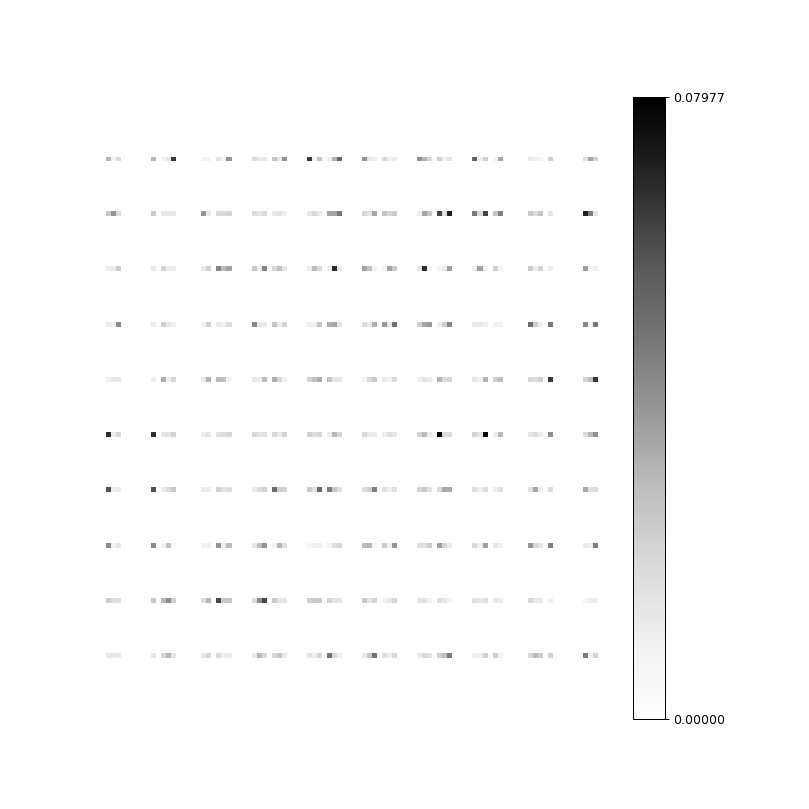

In [86]:
fig = plt.figure(figsize=(10, 10))

draw_weights(lat_ex, 10, 10, 10, fig)

<IPython.core.display.Javascript object>


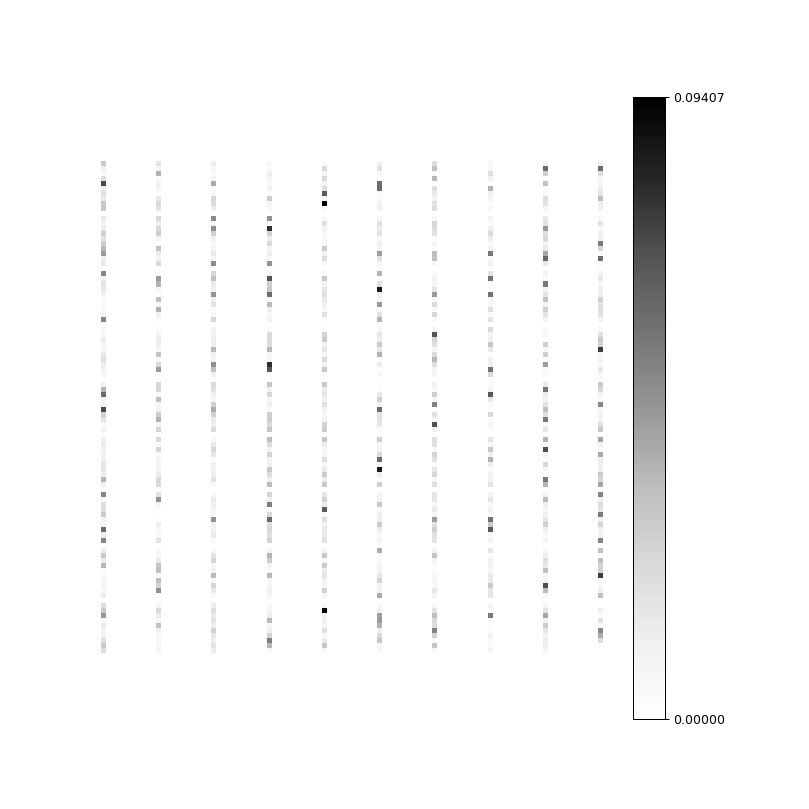

In [87]:
fig = plt.figure(figsize=(10, 10))

draw_weights(m_lat_in, 10, 10, 10, fig)

<IPython.core.display.Javascript object>


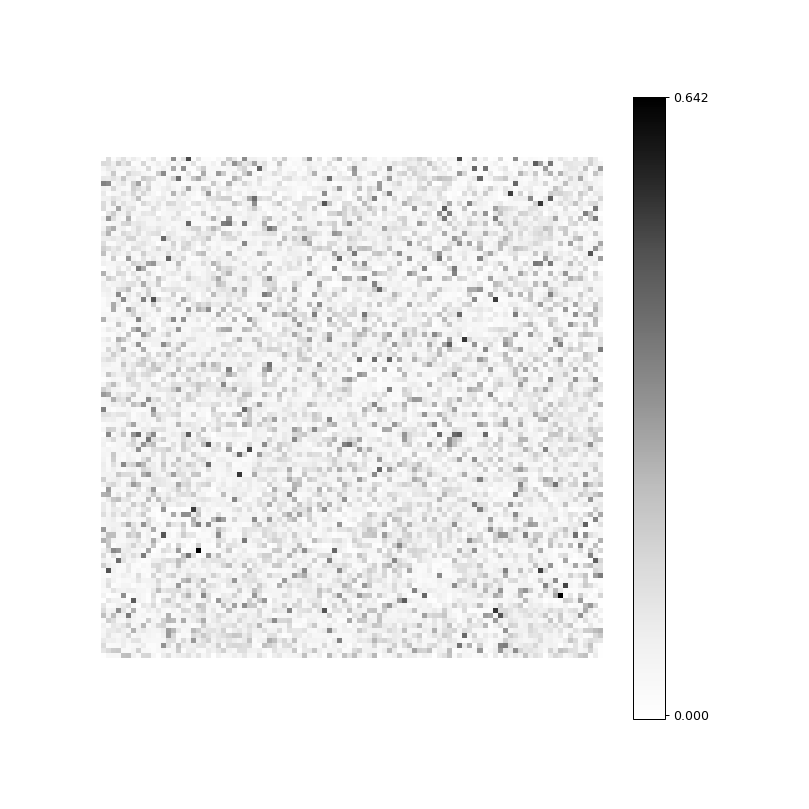

In [88]:
fig = plt.figure(figsize=(10, 10))

draw_weights(g_lat_in, 10, 10, 10, fig)

<IPython.core.display.Javascript object>


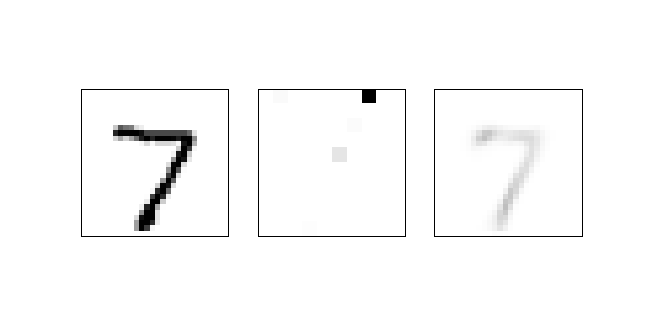

In [93]:
img_i = 0

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


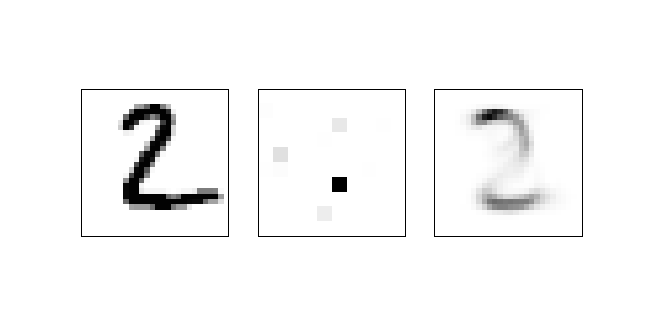

In [94]:
img_i = 1

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


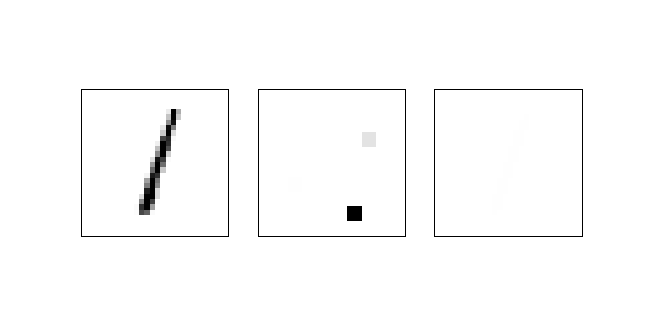

In [95]:
img_i = 2

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


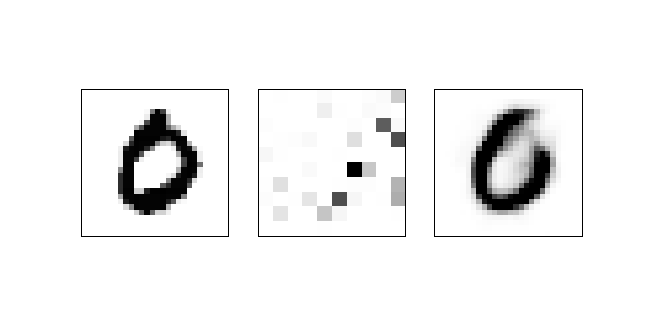

In [96]:
img_i = 3

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


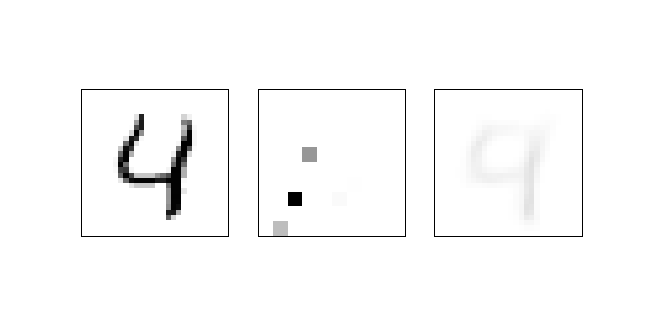

In [97]:
img_i = 4

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


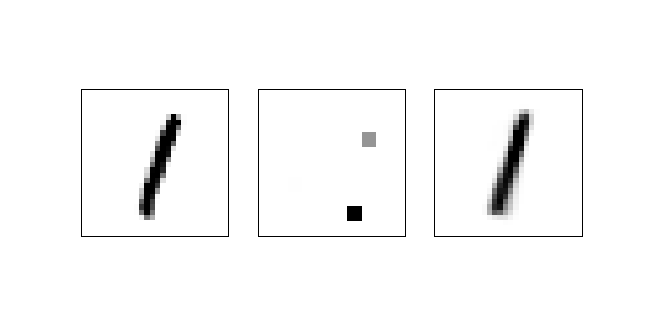

In [98]:
img_i = 5

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

Wowza.  I guess this is better?  I think I'm going to break each digit into 5 pieces, and see how that goes.  

I'm also going to change the shape of the lateral excitation.

<IPython.core.display.Javascript object>


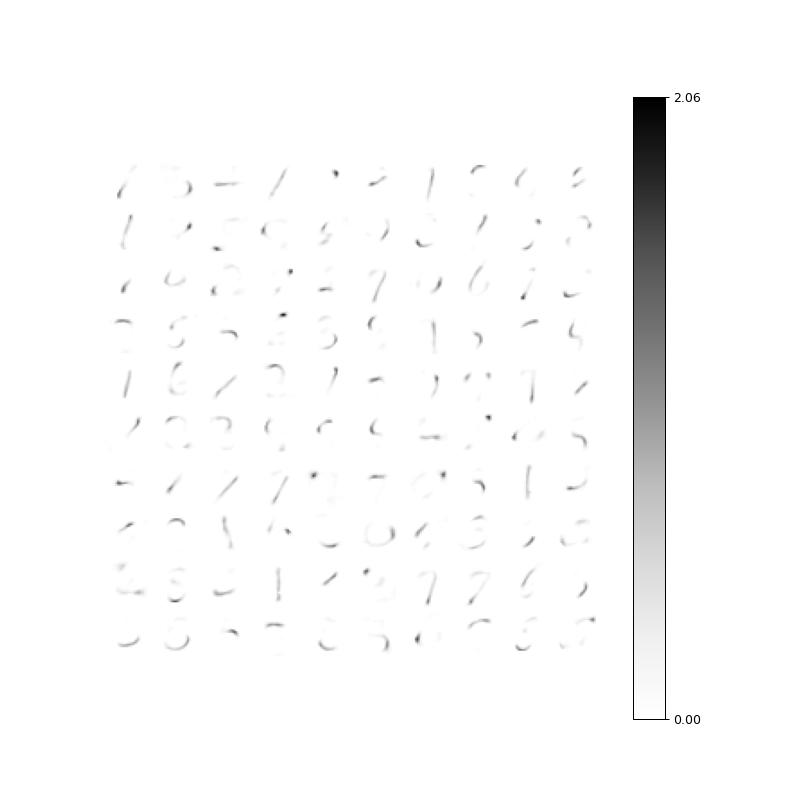

100%|███████████████████████████████████████████████████████████| 6000/6000 [00:04<00:00, 1347.02it/s]


In [99]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 6000

Kx = 10
Ky = 10
N = Kx * Ky
m_len = 28 * 28
tr_len = 60000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.02

# Initialize topological excitation
y_ex = 1    # Vertical neighbor max distance
x_ex = 2    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
# lat_ex = np.array(lat_ex_mask)
# lat_ex /= np.linalg.norm(lat_ex, axis=1)
lat_ex = np.zeros((N, N))
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.0001

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
np.fill_diagonal(m_lat_in_mask, 0)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.001 / Ky

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 3
sp = 0.05
sp2 = sp * sp

for ep in range(Nep):
    inputs = m_flat_tr[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
        
        # Train
        
        # Global inhibition
        g_lat_in += ((o * o.T) - sp2) * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += ((o * o.T) - sp2) * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_weights(w, Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


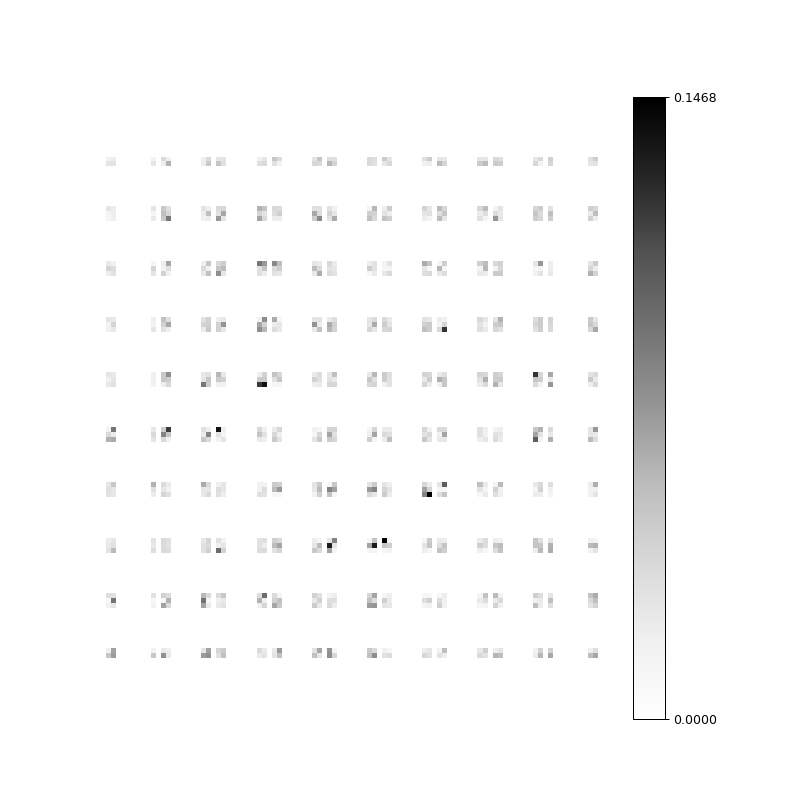

In [100]:
fig = plt.figure(figsize=(10, 10))

draw_weights(lat_ex, 10, 10, 10, fig)

<IPython.core.display.Javascript object>


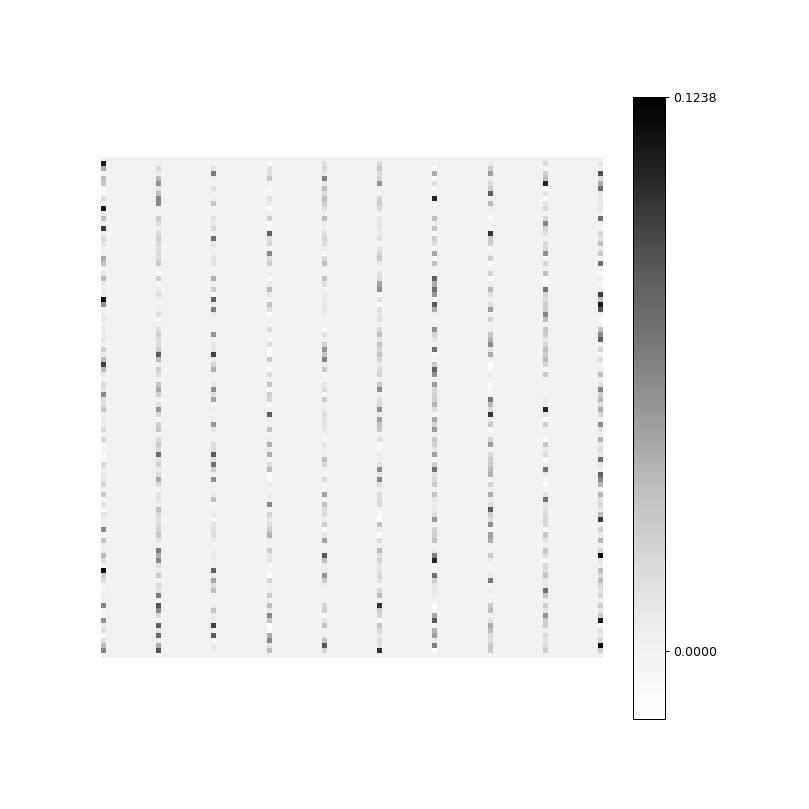

In [101]:
fig = plt.figure(figsize=(10, 10))

draw_weights(m_lat_in, 10, 10, 10, fig)

<IPython.core.display.Javascript object>


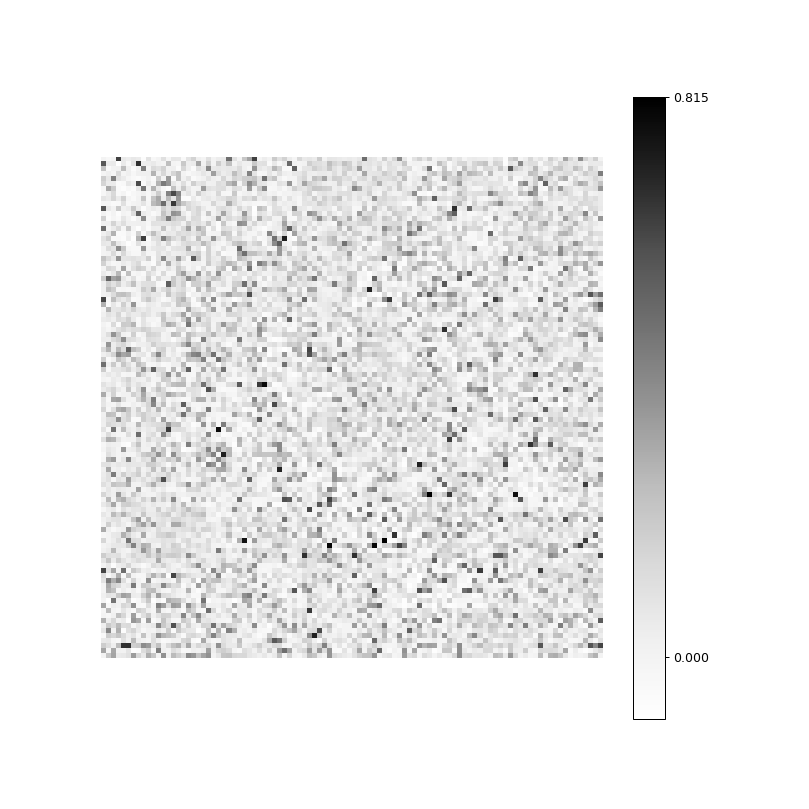

In [102]:
fig = plt.figure(figsize=(10, 10))

draw_weights(g_lat_in, 10, 10, 10, fig)

<IPython.core.display.Javascript object>


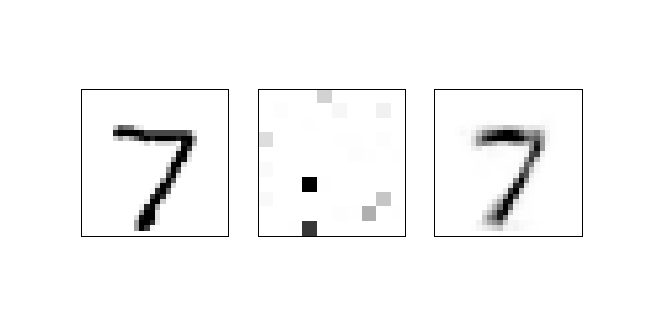

In [103]:
img_i = 0

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


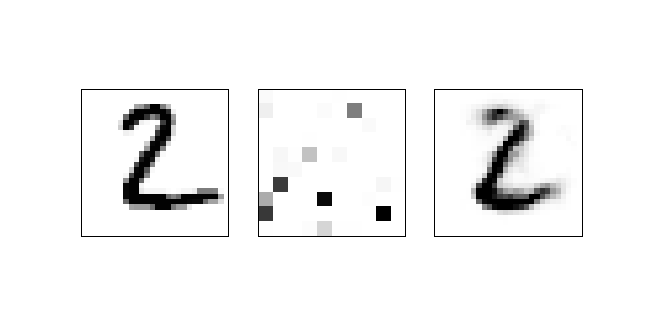

In [104]:
img_i = 1

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


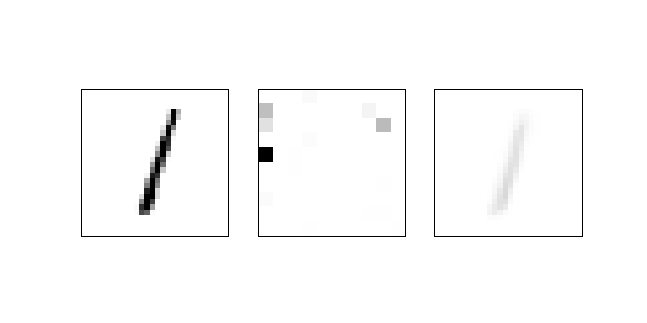

In [105]:
img_i = 2

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


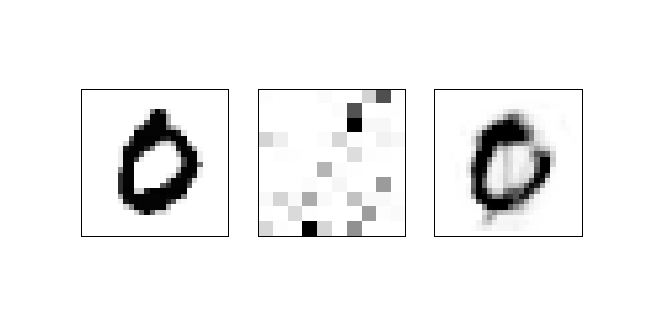

In [106]:
img_i = 3

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


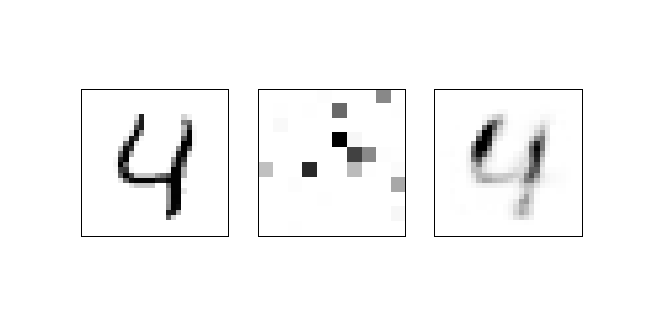

In [107]:
img_i = 4

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


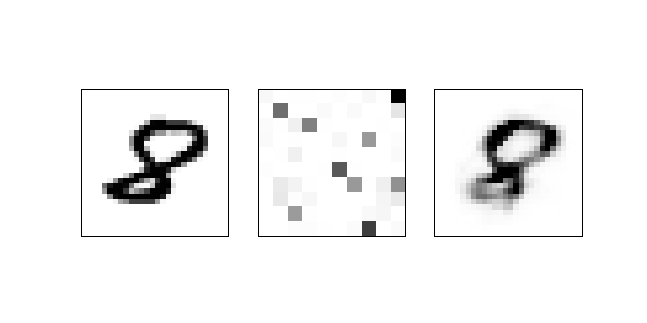

In [113]:
img_i = 61

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(10, 10), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

Well, there doesn't appear to be much topologically afoot with this bad boi, but at least I'm getting better reconstructions.  I'm going to try this with 400 neurons, and see what happens.  I'm also going to increase the vertical inhibition.  Maybe that'll do good things?  I don't know.

<IPython.core.display.Javascript object>


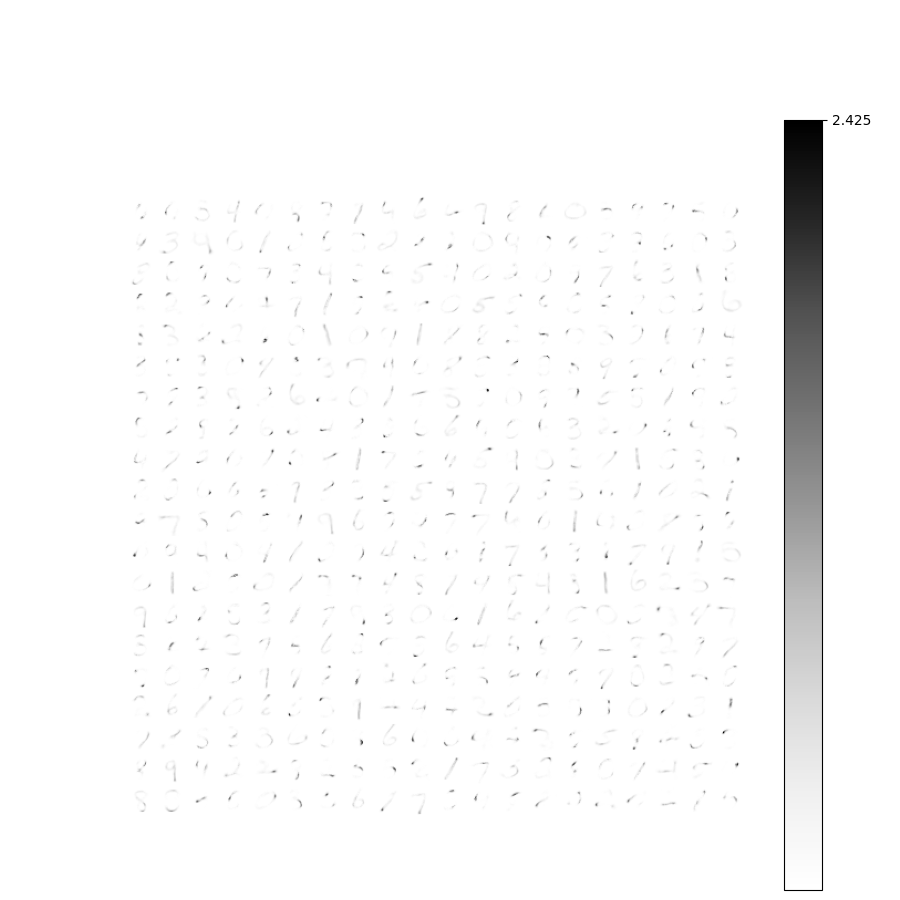

  5%|███▏                                                          | 309/6000 [00:04<01:20, 70.99it/s]


KeyboardInterrupt: 

In [114]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 6000

Kx = 20
Ky = 20
N = Kx * Ky
m_len = 28 * 28
tr_len = 60000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.02

# Initialize topological excitation
y_ex = 1    # Vertical neighbor max distance
x_ex = 2    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
# lat_ex = np.array(lat_ex_mask)
# lat_ex /= np.linalg.norm(lat_ex, axis=1)
lat_ex = np.zeros((N, N))
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.0001

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
np.fill_diagonal(m_lat_in_mask, 0)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.001 / Ky

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 3
sp = 0.0125
sp2 = sp **2
sp4 = sp2 ** 2

for ep in range(Nep):
    inputs = m_flat_tr[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
        
        # Train
        
        # Global inhibition
        g_lat_in += ((o * o.T) - sp2) * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += ((o * o.T) - sp4) * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_weights(w, Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


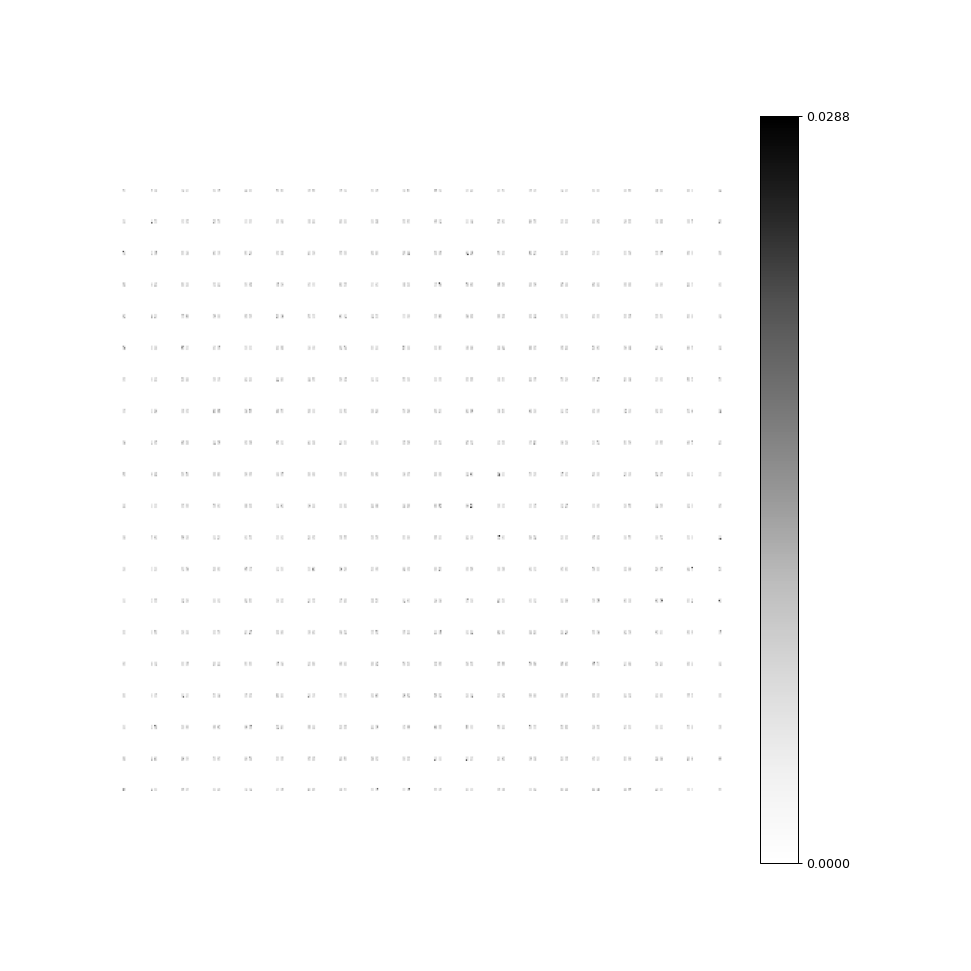

In [118]:
fig = plt.figure(figsize=(12, 12))

draw_weights(lat_ex, 20, 20, 20, fig)

<IPython.core.display.Javascript object>


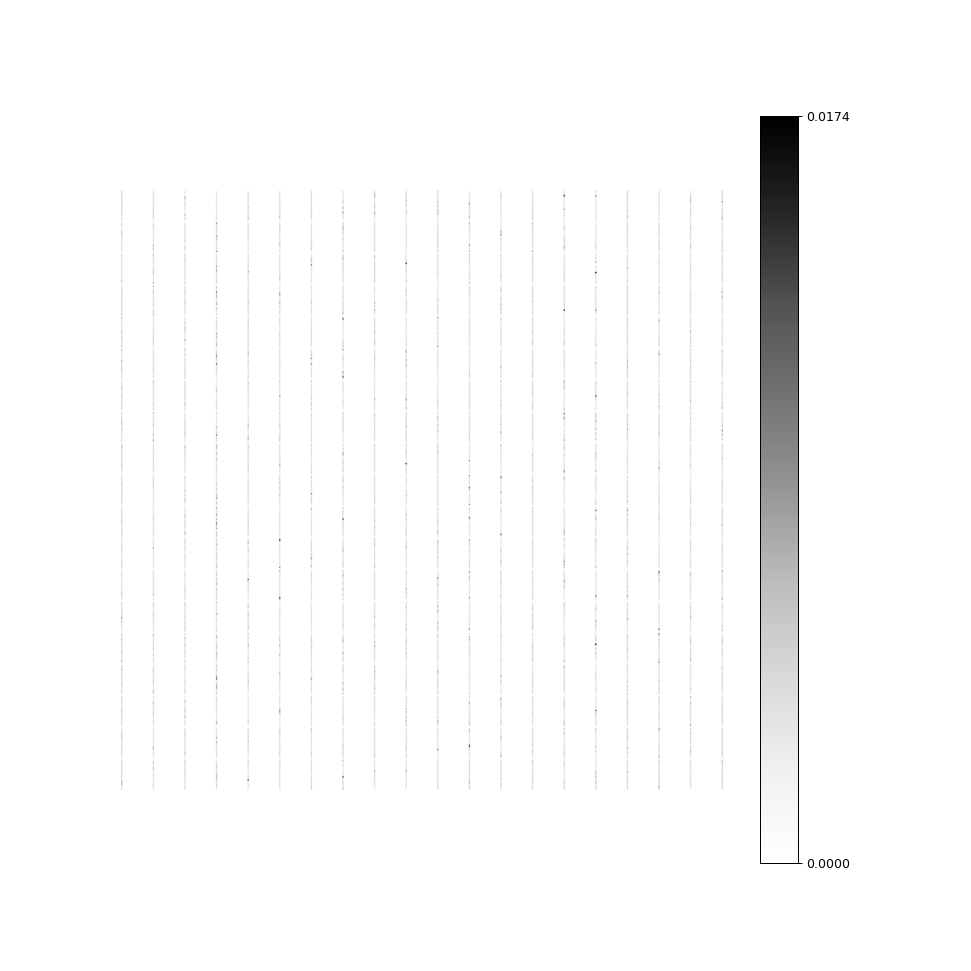

In [117]:
fig = plt.figure(figsize=(12, 12))

draw_weights(m_lat_in, 20, 20, 20, fig)

<IPython.core.display.Javascript object>


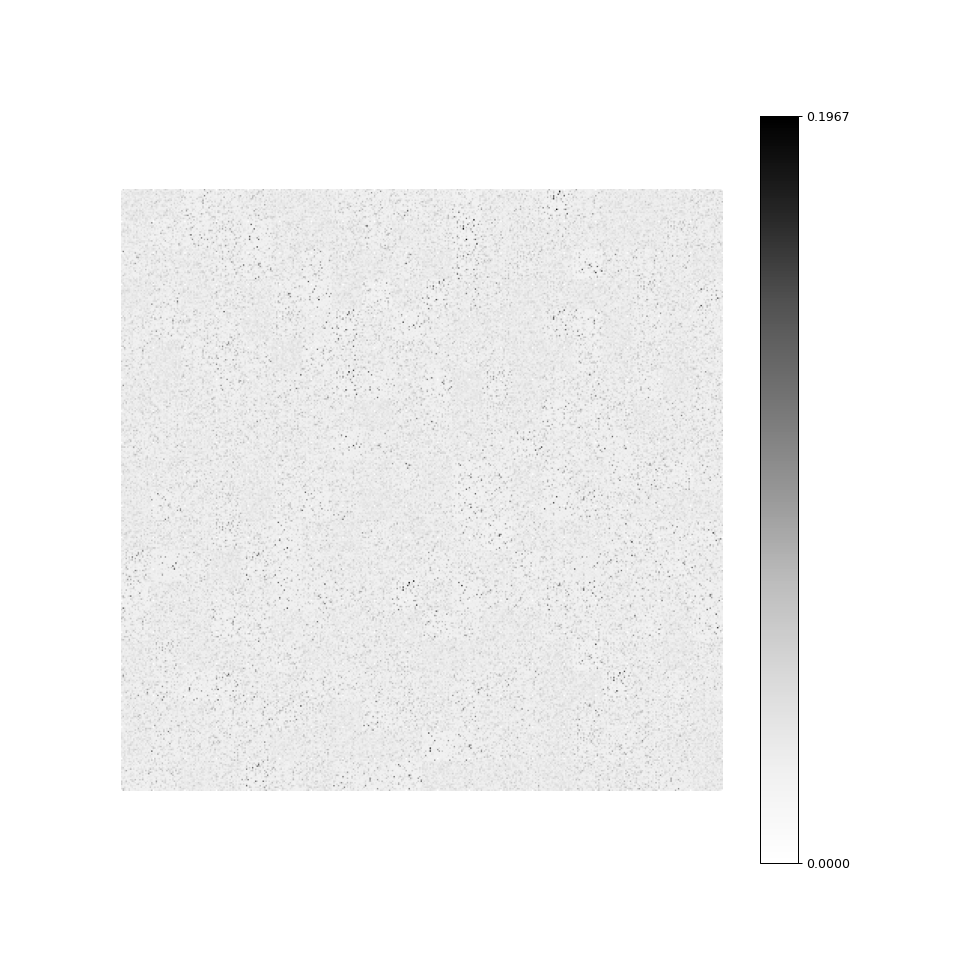

In [119]:
fig = plt.figure(figsize=(12, 12))

draw_weights(g_lat_in, 20, 20, 20, fig)

<IPython.core.display.Javascript object>


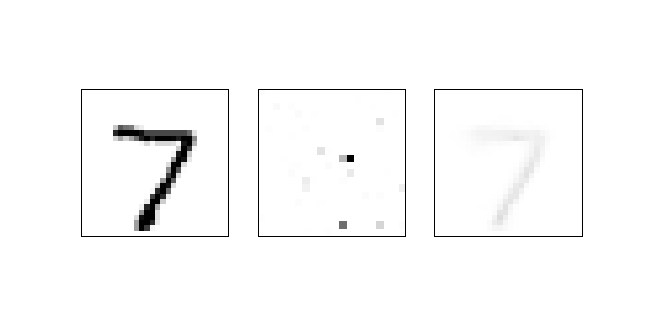

In [121]:
img_i = 0

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


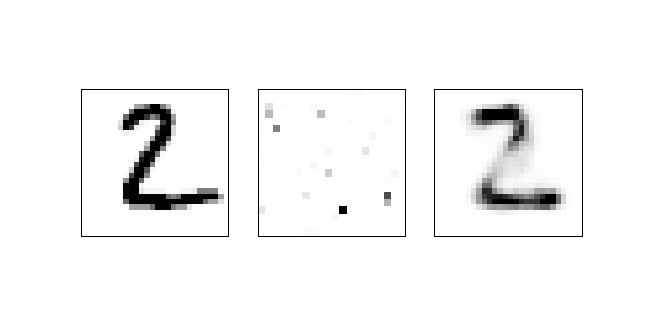

In [122]:
img_i = 1

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


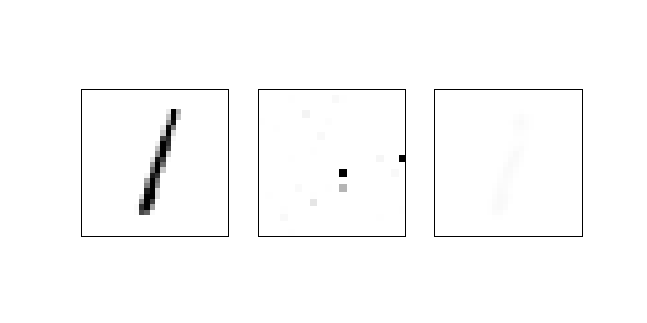

In [123]:
img_i = 2

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


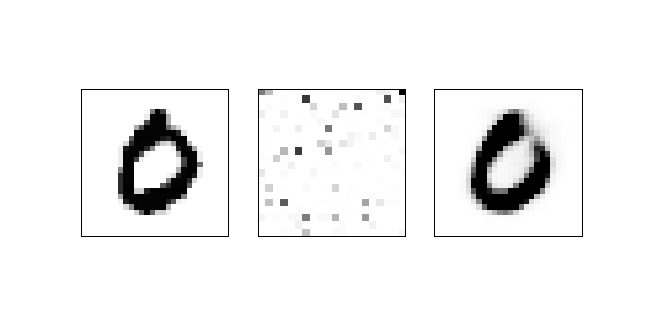

In [124]:
img_i = 3

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


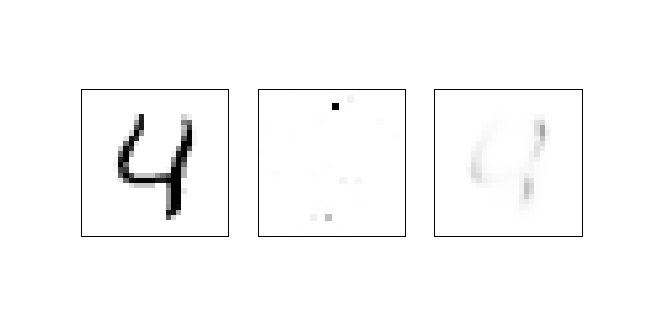

In [126]:
img_i = 4

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


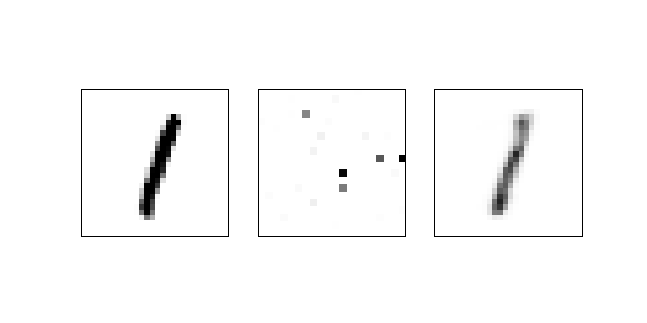

In [127]:
img_i = 5

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


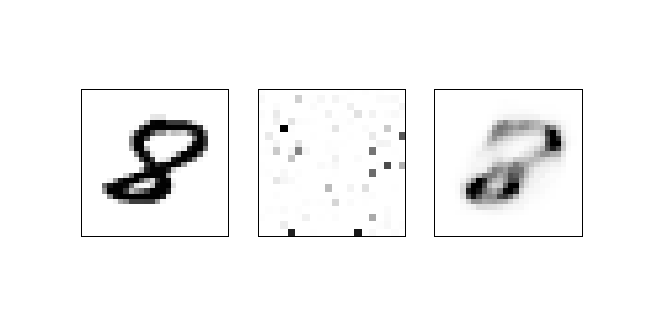

In [128]:
img_i = 61

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

You know what? I'm going to bump the sparsity down to `sp = 0.01`, and I'm going to initialize the excitatory synapses to be full value.  I'm also going to decrease the feedforward learning constant.

<IPython.core.display.Javascript object>


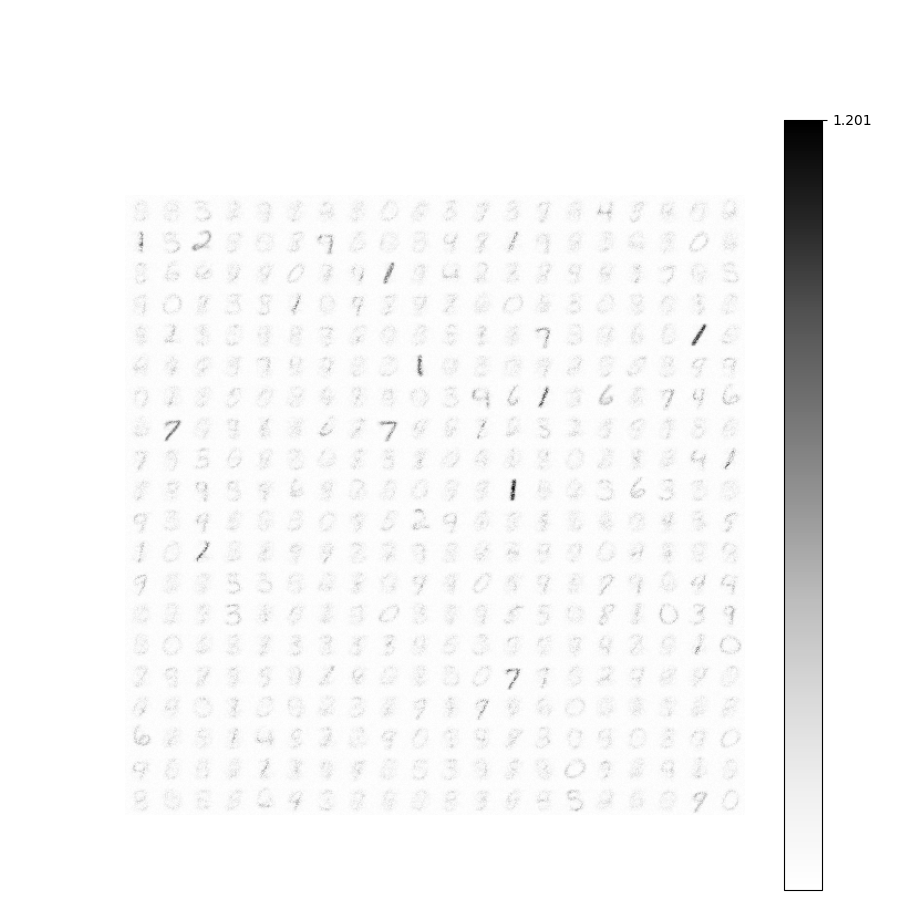

 48%|█████████████████████████████                                | 2863/6000 [00:35<00:40, 78.11it/s]

KeyboardInterrupt: 

In [135]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 6000

Kx = 20
Ky = 20
N = Kx * Ky
m_len = 28 * 28
tr_len = 60000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.005

# Initialize topological excitation
y_ex = 1    # Vertical neighbor max distance
x_ex = 2    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
lat_ex = np.array(lat_ex_mask)
lat_ex /= np.linalg.norm(lat_ex, axis=1).reshape(-1, 1)
        
# lat_ex = np.zeros((N, N))
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.0001

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
np.fill_diagonal(m_lat_in_mask, 0)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.001 / Ky

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 3
sp = 0.01
sp2 = sp ** 2
sp4 = sp2 ** 2

for ep in range(Nep):
    inputs = m_flat_tr[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
        
        # Train
        
        # Global inhibition
        g_lat_in += ((o * o.T) - sp2) * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += ((o * o.T) - sp4) * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_weights(w, Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


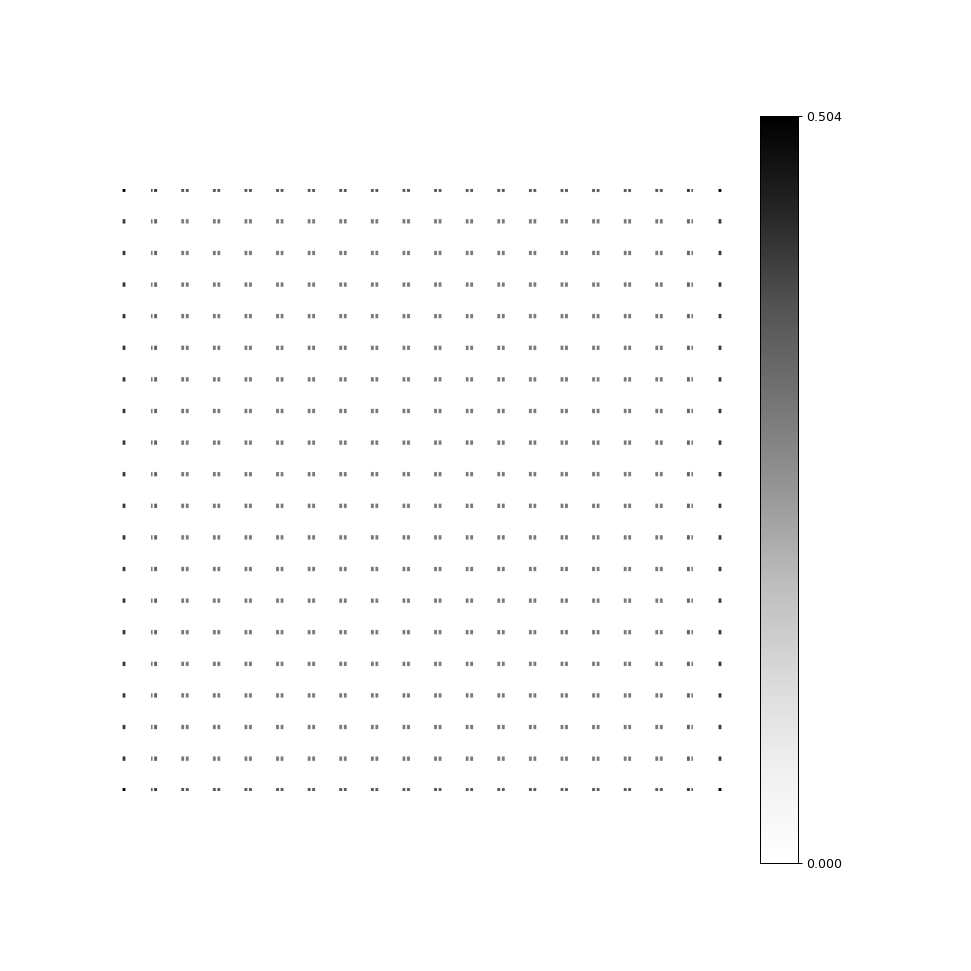

In [136]:
fig = plt.figure(figsize=(12, 12))

draw_weights(lat_ex, 20, 20, 20, fig)

<IPython.core.display.Javascript object>


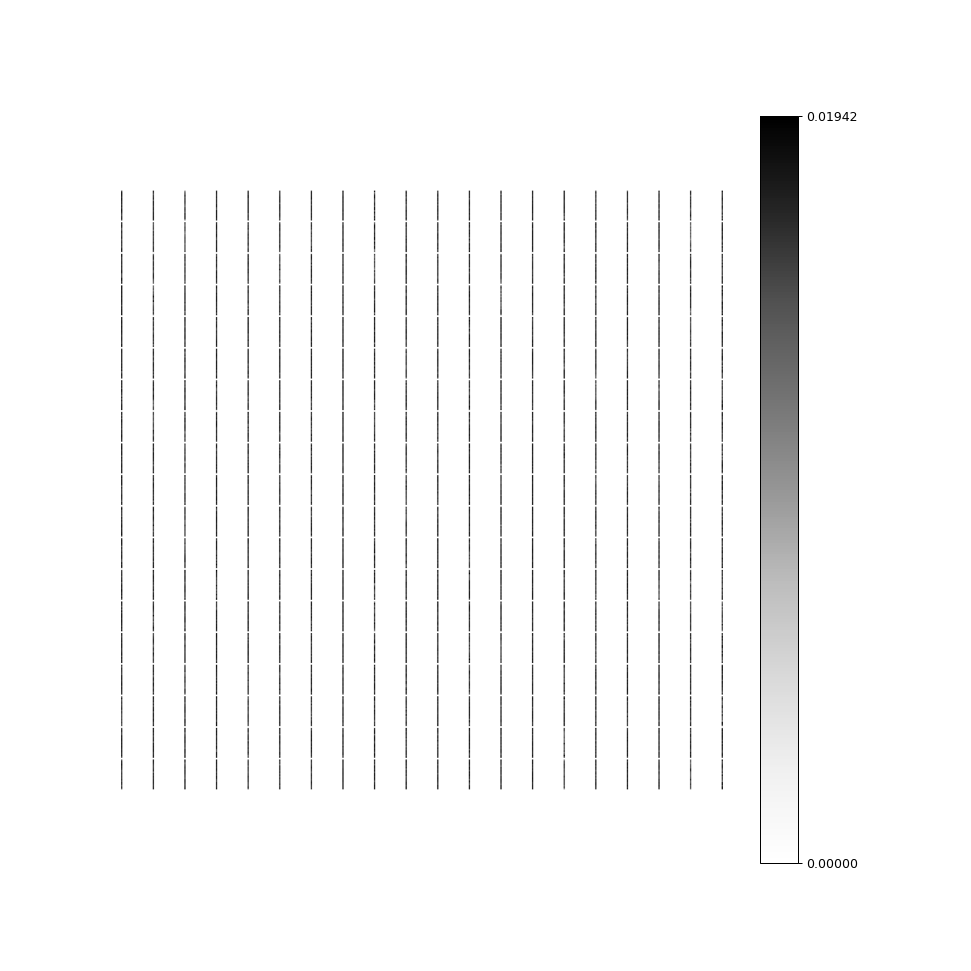

In [137]:
fig = plt.figure(figsize=(12, 12))

draw_weights(m_lat_in, 20, 20, 20, fig)

<IPython.core.display.Javascript object>


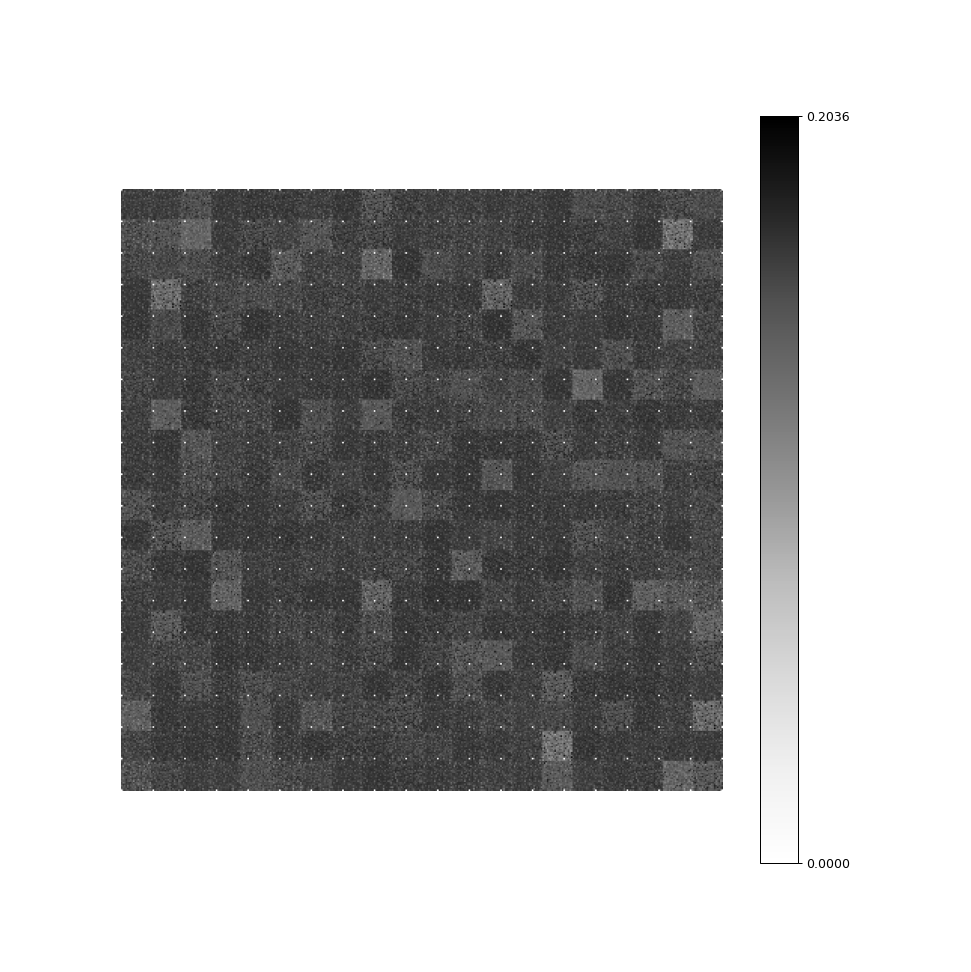

In [138]:
fig = plt.figure(figsize=(12, 12))

draw_weights(g_lat_in, 20, 20, 20, fig)

<IPython.core.display.Javascript object>


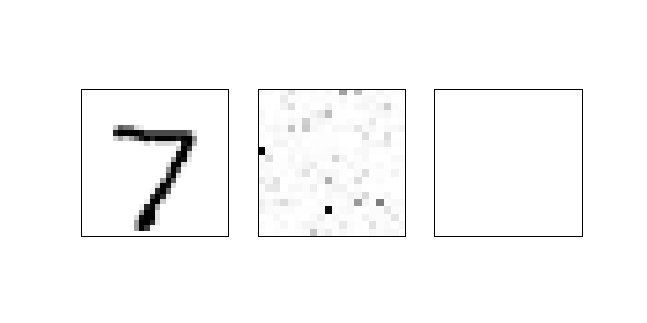

In [139]:
img_i = 0

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


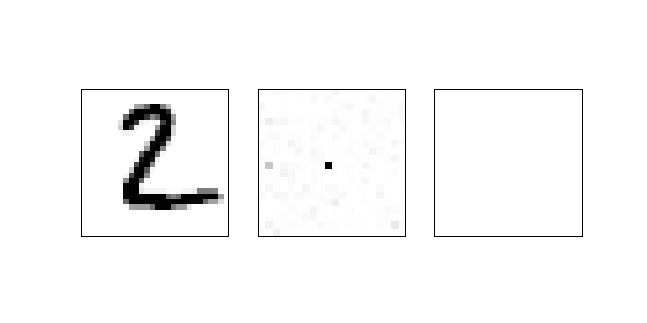

In [140]:
img_i = 1

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


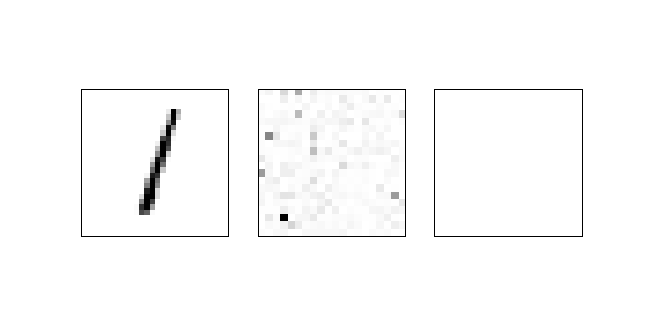

In [141]:
img_i = 2

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


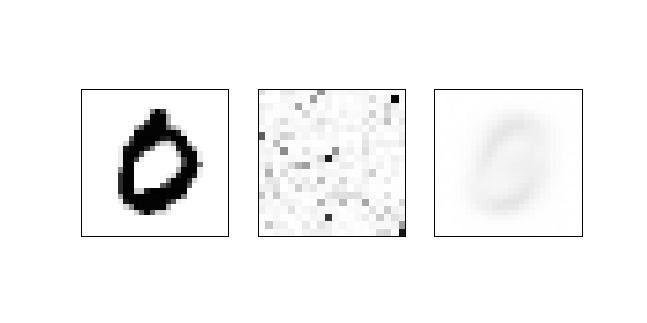

In [142]:
img_i = 3

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


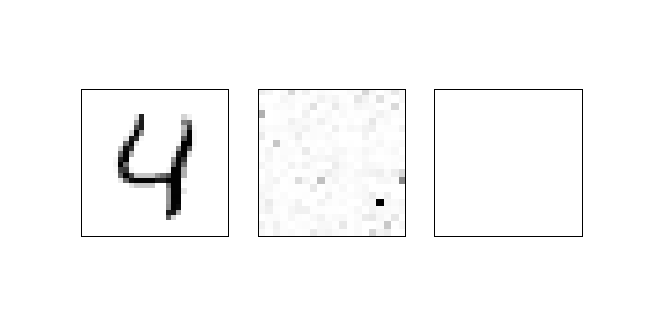

In [143]:
img_i = 4

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


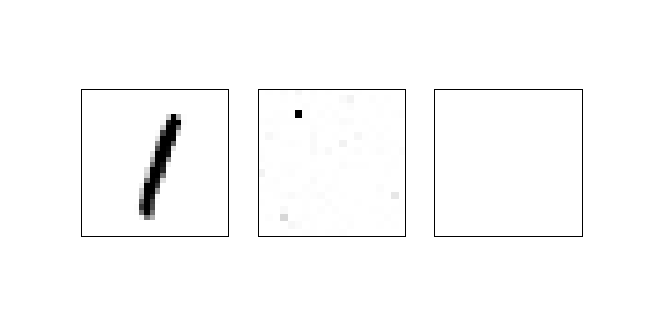

In [144]:
img_i = 5

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


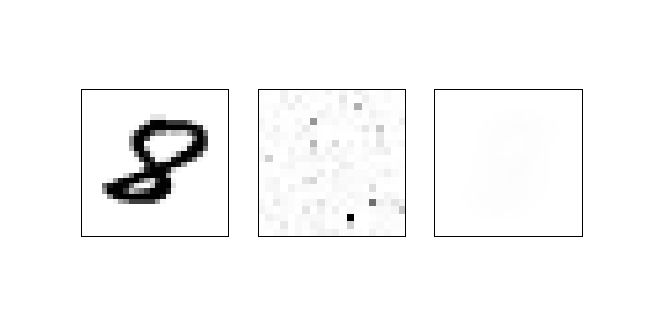

In [145]:
img_i = 61

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

That's the WOAT.  I'm going to up `xi`, and see if that helps.  I'm also going to drop `gamma` a bit.

<IPython.core.display.Javascript object>


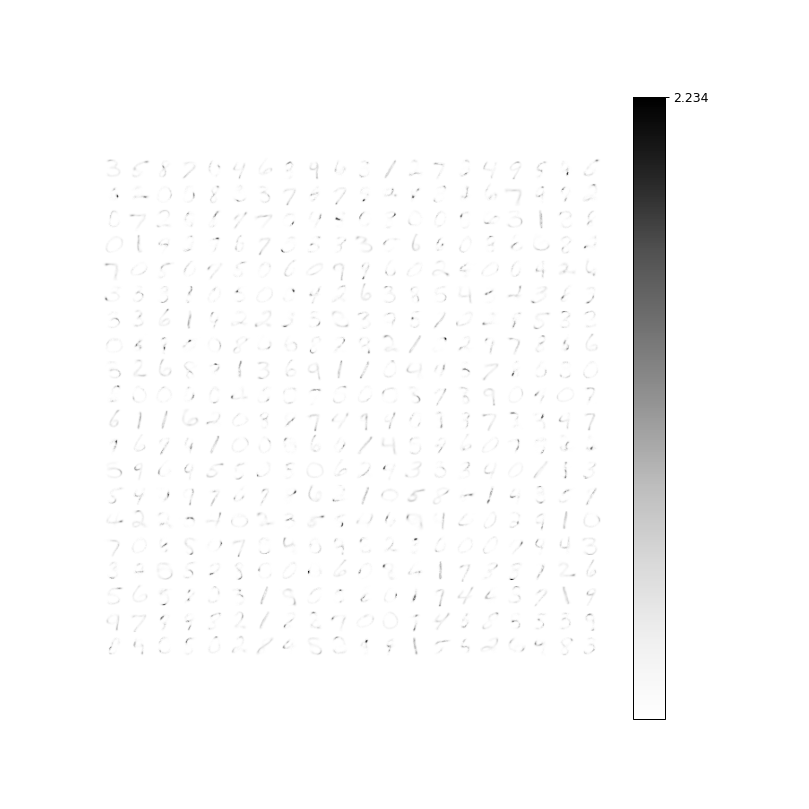

100%|█████████████████████████████████████████████████████████████| 6000/6000 [01:23<00:00, 62.13it/s]


In [2]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 6000

Kx = 20
Ky = 20
N = Kx * Ky
m_len = 28 * 28
tr_len = 60000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.01

# Initialize topological excitation
y_ex = 1    # Vertical neighbor max distance
x_ex = 2    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
lat_ex = np.array(lat_ex_mask)
lat_ex /= np.linalg.norm(lat_ex, axis=1).reshape(-1, 1)
        
# lat_ex = np.zeros((N, N))
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.0001

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
np.fill_diagonal(m_lat_in_mask, 0)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.0005

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 1
sp = 0.01
sp2 = sp ** 2
sp4 = sp2 ** 2

for ep in range(Nep):
    inputs = m_flat_tr[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
        
        # Train
        
        # Global inhibition
        g_lat_in += ((o * o.T) - sp2) * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += ((o * o.T) - sp4) * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_weights(w, Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


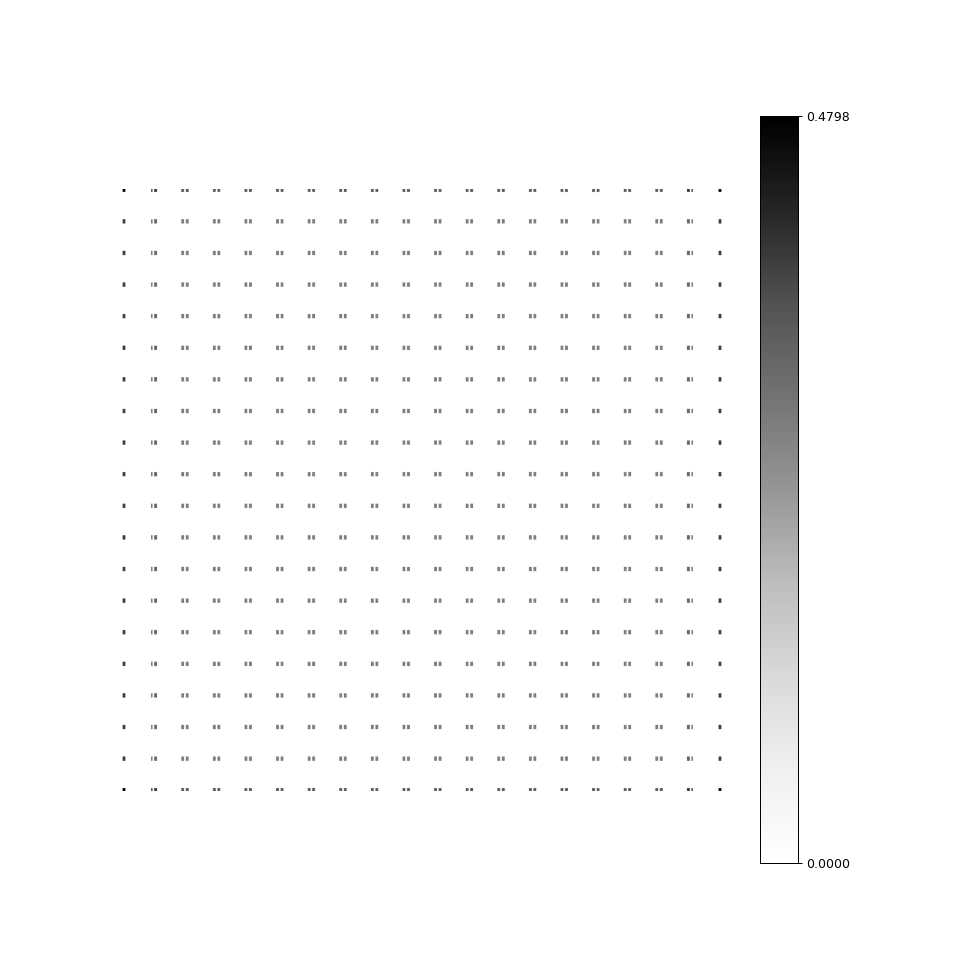

In [3]:
fig = plt.figure(figsize=(12, 12))

draw_weights(lat_ex, 20, 20, 20, fig)

<IPython.core.display.Javascript object>


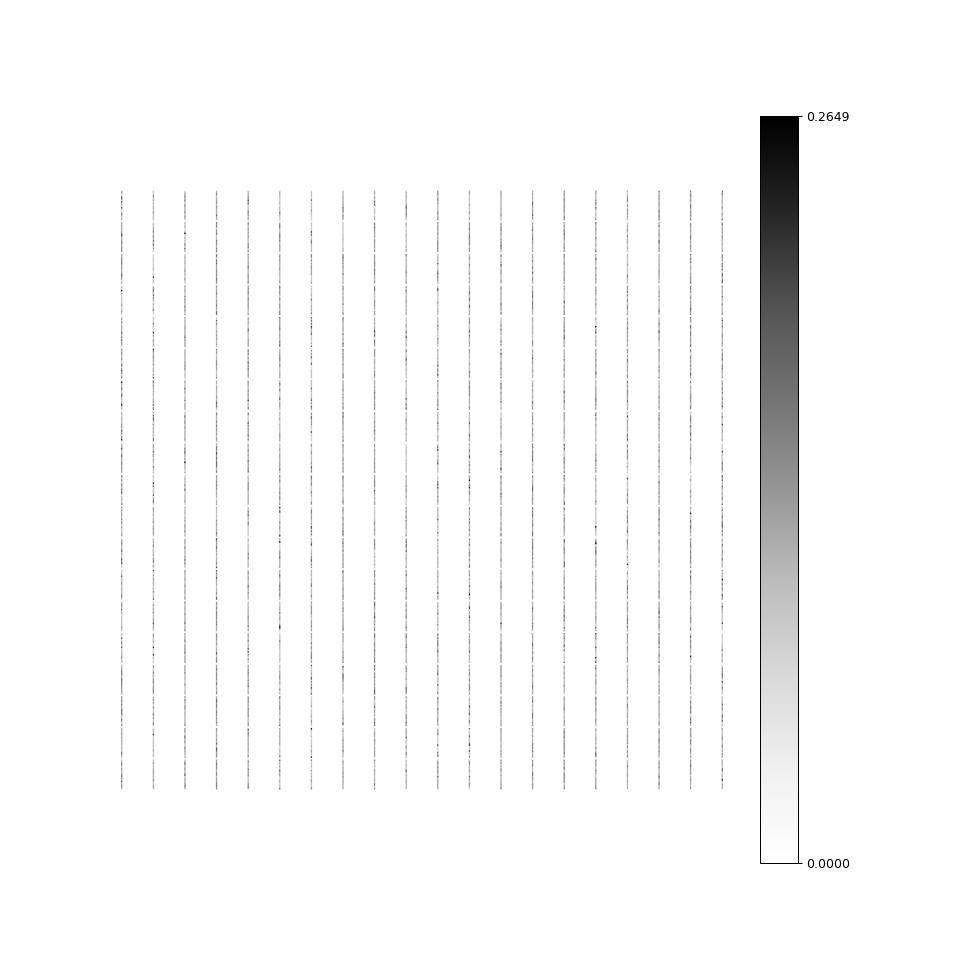

In [4]:
fig = plt.figure(figsize=(12, 12))

draw_weights(m_lat_in, 20, 20, 20, fig)

<IPython.core.display.Javascript object>


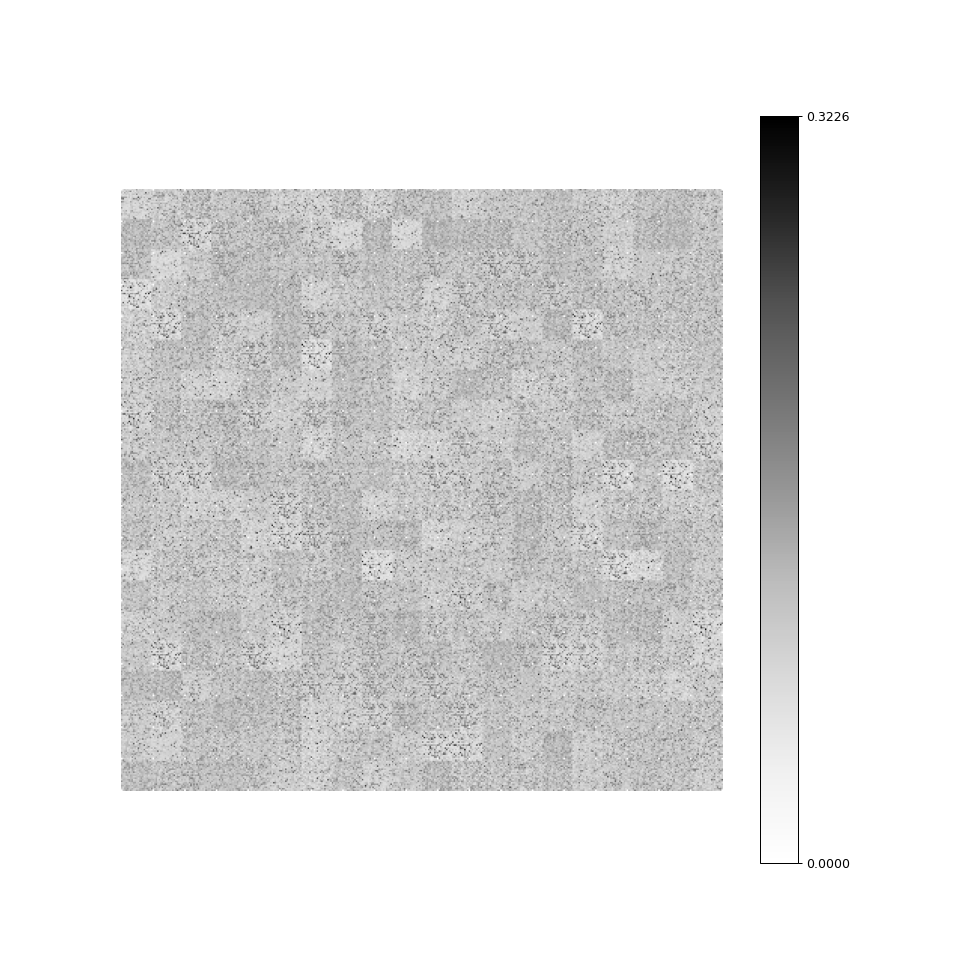

In [5]:
fig = plt.figure(figsize=(12, 12))

draw_weights(g_lat_in, 20, 20, 20, fig)

<IPython.core.display.Javascript object>


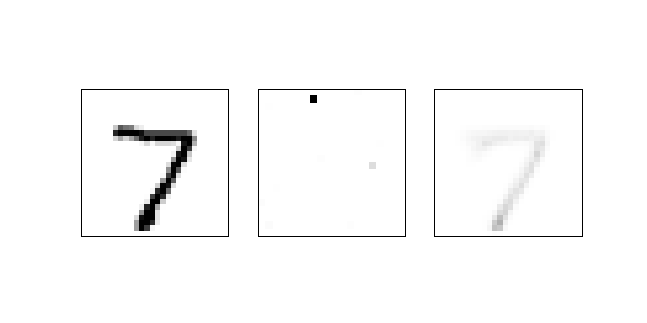

In [6]:
img_i = 0

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


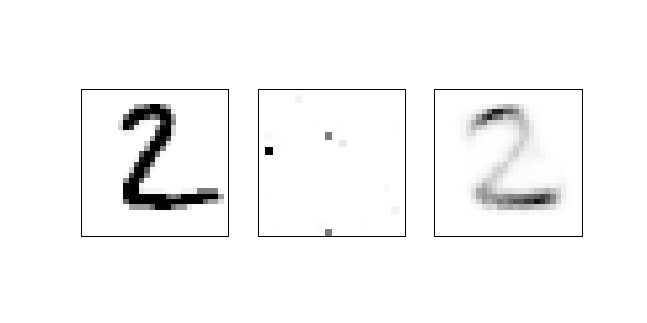

In [7]:
img_i = 1

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


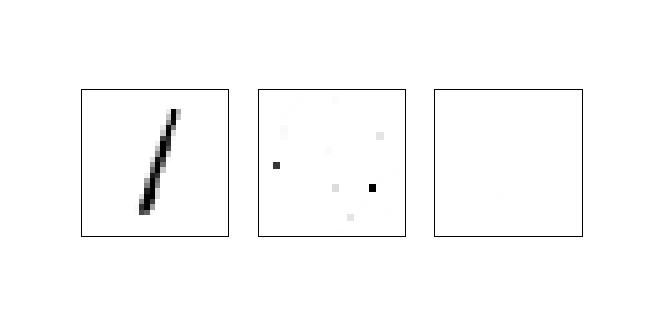

In [8]:
img_i = 2

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


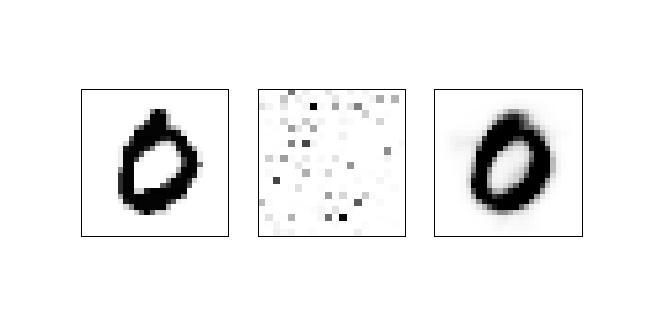

In [9]:
img_i = 3

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


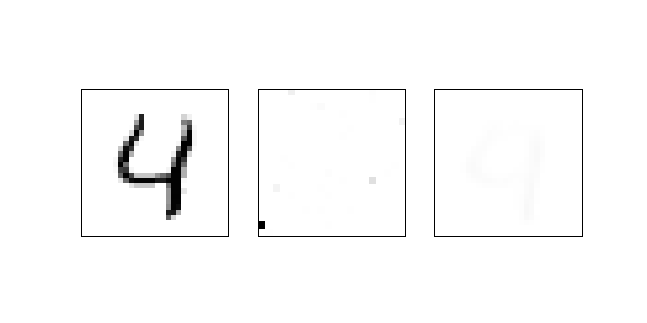

In [10]:
img_i = 4

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


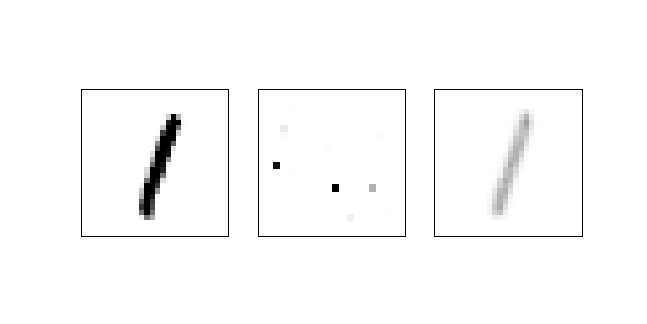

In [11]:
img_i = 5

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

<IPython.core.display.Javascript object>


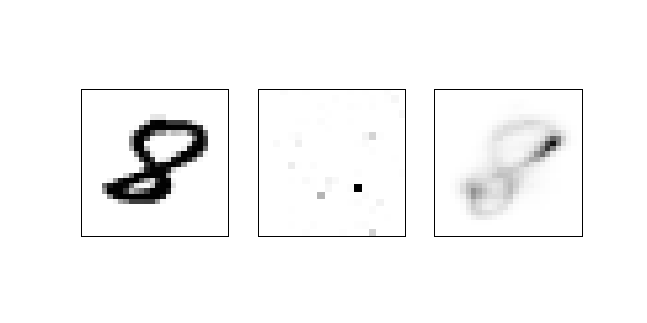

In [12]:
img_i = 61

s_len = 28

img = m_flat_te[img_i]

v = img.reshape(-1, 1)
w_v = w @ v
ff = sig(w_v - t)
o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len), cmap="Greys")

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(20, 20), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len), cmap="Greys", vmax=1)

plt.show()

Much anger.  I'm going to run this architecture on cifar, just to do it, and then I'm wrapping this bad boi up unless I see a fucking miracle.

In [13]:
from tensorflow.keras.datasets import cifar10
from tqdm import tqdm
from scipy.special import expit as sig

(tr_x, _), (te_x, _) = cifar10.load_data()

In [14]:
s_len = 10
slh = s_len // 2
sl2 = s_len * s_len

data = tr_x[:, 16 - slh: 16 + slh, 16 - slh: 16 + slh]
flat_data = data.reshape(-1, sl2 * 3) / 255.0
fd_len = flat_data.shape[0]

te_data = te_x[:, 16 - slh: 16 + slh, 16 - slh: 16 + slh]
te_flat_data = te_data.reshape(-1, sl2 * 3) / 255.0

In [15]:
def draw_color_weights(w, Kx, Ky, fig, s_len):
    tapestry = np.zeros((s_len * Kx, s_len * Ky, 3))
    
    w_i = 0
    for y in range(Ky):
        for x in range(Kx):
            tapestry[y * s_len: (y + 1) * s_len, x * s_len: (x + 1) * s_len] = w[w_i].reshape(s_len, s_len, 3)
            w_i += 1
            
    plt.clf()        
    im = plt.imshow(tapestry)
    plt.axis("off")
    fig.canvas.draw()

<IPython.core.display.Javascript object>


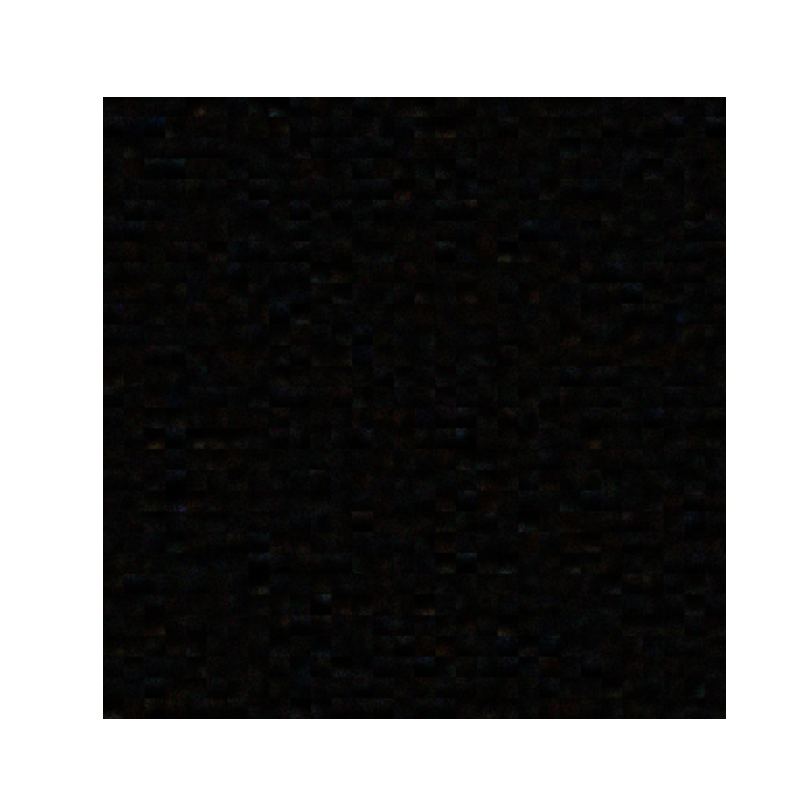

100%|█████████████████████████████████████████████████████████████| 1000/1000 [00:45<00:00, 21.87it/s]


In [19]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 50
T_s = 1000

Kx = 30
Ky = 30
N = Kx * Ky
m_len = 300
tr_len = 50000

prec = 1e-10

# Initialize feedforward synapses
w = np.random.uniform(0.1, 1, (N, m_len))
xi = 0.02

# Initialize topological excitation
y_ex = 1    # Vertical neighbor max distance
x_ex = 2    # Horizontal neighbor max distance

lat_ex_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), max(x - x_ex, 0): x] = 1
        mask[max(0, y - y_ex): min(y + y_ex + 1, Ky), min(x + 1, Kx): min(x + x_ex + 1, Kx)] = 1
        lat_ex_mask.append(mask.reshape(-1))
        
lat_ex_mask = np.array(lat_ex_mask)
lat_ex = np.array(lat_ex_mask)
lat_ex /= np.linalg.norm(lat_ex, axis=1).reshape(-1, 1)
        
# lat_ex = np.zeros((N, N))
# lat_ex = np.random.uniform(0.01, 0.1, (N, N))
# lat_ex *= lat_ex_mask


alpha = 0.0001

# Initialize global inhibition
g_lat_in = np.zeros((N, N))
np.fill_diagonal(g_lat_in, 0)

beta = 0.0005

# Initialize manifold inhibition
m_lat_in_mask = []
for y in range(Ky):
    for x in range(Kx):
        mask = np.zeros((Ky, Kx))
        mask[:, x] = 1
        m_lat_in_mask.append(mask.reshape(-1))
        
m_lat_in_mask = np.array(m_lat_in_mask)
np.fill_diagonal(m_lat_in_mask, 0)
m_lat_in = np.zeros((N, N))
m_lat_in *= m_lat_in_mask

zeta = 0.0005

# Initialize sparsity threshold
t = np.zeros((N, 1))
gamma = 1
sp = 0.022
sp2 = sp ** 2
sp4 = sp2 ** 2

for ep in range(Nep):
    inputs = flat_data[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
        
        # Train
        
        # Global inhibition
        g_lat_in += ((o * o.T) - sp2) * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += ((o * o.T) - sp4) * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_color_weights(w, Kx, Ky, fig, 10)

In [20]:
for ep in range(Nep):
    inputs = flat_data[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
        
        # Train
        
        # Global inhibition
        g_lat_in += ((o * o.T) - sp2) * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += ((o * o.T) - sp4) * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_color_weights(w, Kx, Ky, fig, 10)

 66%|█████████████████████████████████████████                     | 662/1000 [00:30<00:15, 21.34it/s]

KeyboardInterrupt: 

<IPython.core.display.Javascript object>


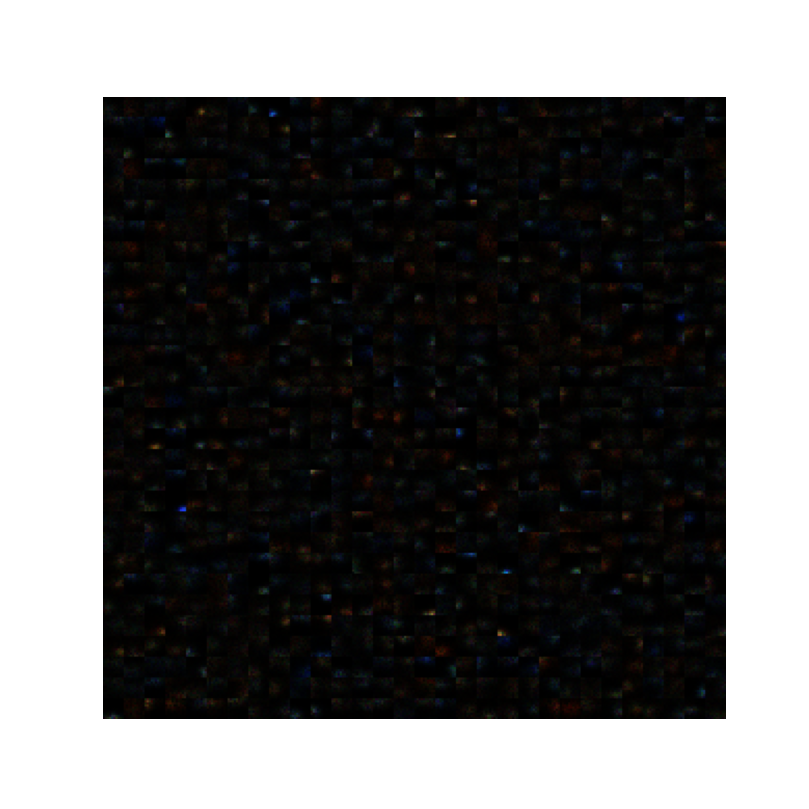

Epoch:  0
Epoch:  1
Epoch:  2
Epoch:  3
Epoch:  4
Epoch:  5
Epoch:  6
Epoch:  7
Epoch:  8
Epoch:  9
Epoch:  10
Epoch:  11
Epoch:  12
Epoch:  13
Epoch:  14
Epoch:  15
Epoch:  16
Epoch:  17
Epoch:  18
Epoch:  19
Epoch:  20
Epoch:  21
Epoch:  22
Epoch:  23
Epoch:  24
Epoch:  25
Epoch:  26
Epoch:  27
Epoch:  28
Epoch:  29
Epoch:  30
Epoch:  31
Epoch:  32
Epoch:  33
Epoch:  34
Epoch:  35
Epoch:  36
Epoch:  37
Epoch:  38
Epoch:  39
Epoch:  40
Epoch:  41
Epoch:  42
Epoch:  43


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:  44


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:  45


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:  46


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:  47


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:  48


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:  49


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [23]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))


for ep in range(Nep):
    inputs = flat_data[np.random.permutation(tr_len)]
    print("Epoch: ", ep)

    for i in range(T_s):
        v = inputs[i].reshape(-1, 1)
        w_v = w @ v
        ff = sig(w_v - t)
        o = sig(w_v + ((lat_ex - g_lat_in - m_lat_in) @ ff) - t)
        
        # Train
        
        # Global inhibition
        g_lat_in += ((o * o.T) - sp2) * beta
        np.fill_diagonal(g_lat_in, 0)

        # Manifold inhibition
        m_lat_in += ((o * o.T) - sp4) * zeta
        m_lat_in *= m_lat_in_mask
        
        # Feedforward
        r = w.T @ o 
        mod_r = np.maximum(r, prec)
        e = v - r
        
        w += w * o * (e / mod_r).T * xi
        
        # Sparsity threshold
        t += (o - sp) * gamma
        
        # Topological Excitation
        lat_ex += lat_ex_mask * o * (o.T - lat_ex) * alpha
        
        if i % 100 == 0:
            w = np.where(w > prec, w, 0.0)
    
    draw_color_weights(w, Kx, Ky, fig, 10)

Well, this is getting out of hand.  Those are absolute garbage features.  Man my fingers are moving super slowly right now cause I went on a long walk.  

Time to wrap this up.

## Conclusions

The network straight-up did not learn topologies and manifolds, as I had desired.  Furthermore, the network is learning so slowly that I think I have to move to a different, faster implementation.  Ie, an FPGA.  

The manner in which the brain is set up is obviously optimized for time-series data.  This is not that.  I don't really know.  I'm still strongly of the opinion that the topologies and manifolds to be learned are incredibly important, but I'm just not sure how to do it.  This (current architecture) seems wrong though.  I might actually try my hand at NLP just because that's so much more time-oriented. Maybe not.  I don't know.  

I need to figure out another way to sew together the feature space.  

You know what?  I think to sew things together, it helps to have infinitesimal transformations.  That way, the network only has to worry about the dynamics (both spatially and temporally), and not the actual functions that govern representation.

I did a poor job of articulating that.  I also need to more properly formulate this thought.  Look for differential equations, not the functions themselves.

## Next Steps

As I already said, the time it's taking to train these networks is getting out of hand.  That being said, the actual dynamics of each neuron is localized and quite straight-forward.  You know what that means?  I think it's time to get out the ol FPGA and give her a whirl.

In terms of actual algorithms, I'm becoming more and more convinced that the network needs time-series information if it's going to learn how to see.  I really think the network needs to see differential transformations, and learn how to manipulate those representations in a differential fashion.  

I need to think about this.  

Anyway, yeah, FPGAs and better algorithms.